# Histopathologic Cancer Detection 

## Purpose and goal definition

Our purpose is to be able to identify metastatic cancer in small image patches taken from larger digital pathology scans, specifically of lymph node sections. Both of us were highly interested in medical, preferebly brain problem, but after not finding a good enough dataset on kaggle for brain pathologies we decided to go with the Histopathologic Cancer Detection dataset which spiked our interest. 

We believe solving these groups of problems is highly important. Being able to detect cancer using an algorithem can potentially shorten detection and diagnosis times, reduce human error and subsequentially save patient lives and reduce further complications.

### So why is solving the Histopathologic Cancer Detection dataset challenge so important?
The **lymph system** is a part of our immune system. It includes a network of lymph vessels and nodes. Lymph vessels are a lot like the veins that collect and carry blood through the body. But instead of carrying blood, these vessels carry the clear watery fluid called lymph. Lymph fluid also contains white blood cells, which help fight infections.

Cancer can appear in the lymph nodes in 2 ways: 
* start there (lymphoma)
* spread there from somewhere else.

In the case of this project it doesn't matter to us if it started there or spread there, the question is, is it there or not. 

Generally speaking, cancer in lymph nodes is hard to find. Normal lymph nodes are tiny and can be hard to find as is, but when there’s any kind of infection, inflammation, or cancer, the nodes can get larger. Those near the body’s surface often get big enough to feel with your fingers, and some can even be seen. But if there are only a few cancer cells in a lymph node, it may look and feel normal. Lymph nodes deep in the body cannot be felt or seen. **Essentially the only way to know whether there is cancer in a lymph node is to do a biopsy**. 

**Histopathology** is the diagnosis and study of diseases of the tissues in order to study the manifestation of different deseases, including cancer. It involves examining tissues and cells under a microscope, **a biopsy**. Histopathologists are doctors who are responsible for that study and the diagnoses that follows, they help clinicians manage a patient's care.

As we can assume, manual detection of a cancer cell is a tiresome task and involves human error. Most parts of the cell are frequently part of irregular random and arbitrary visual angles. As we already mentioned, the only way to detect cancer in a lymph node is using a biopsy. Machine learning algorithems can be applied to obtain better results as compared with manual pathological detection systems, this means that solving this challenge can be cruicial for lymph node cancer patients.  

**The goal** is to identify whether a tumor is benign or of a malignant in nature, malignant tumors are cancerous, which means they should be treated as soon as possible to reduce and prevent further complications. In other words we are dealing with a **binary classification problem**.

### WSI images
Whole slide images (WSI) is the scanning of conventional glass slides in order to produce digital slides. **The images collected for these datasets are region of interest, ROI, extracted from the original WSI.** With authors of the dataset ensuring no overlaps between WSI exist. 

Digitizing an entire glass slide is a complex multistep process that depends on the integration of many factors, like hardware used for scanning, robotics and software. Even if all of these are top notch, still producing optimal quality WSIs also depends on the skills of an operator who guides the scanning procedure in addition to robust quality control (QC) measures starting from receiving the specimen through fixation, processing, and slide preparation prior to the actual scanning process and acquisition of the WSI. 

The authors of this dataset took several quality conntrol measures, specifically for the purpose of prevention selecting background patches, slides were converted to HSV, blurred, and patches filtered out if maximum pixel saturation lies below 0.07.

But WSI images can consist of more types of bad quality patches aside from backgrounds. Glass slides should be intact, appropriately stained and dried, clean without any ink markings, properly placed coverslips without hanging over the edge of the glass slide, and with no air bubbles. The glass slide label should be flat and not extending past the slide edge or covering tissue on the slides. Presence of air bubbles in the slides can produce uneven surface and bad quality pictures in the process of digitilization. 

Lets talk more about that process of histological sample digitalization in general.

### Challenges while dealing with histological images
In order to obtain digitalized histological images from a histological sample while preserving it's internal architecture, so that the image is similar to the aspects inside a living organisem, specific sequential steps are followed. These are typically carried out manually by laboratory technicians (Bancroft and Gamble, 2008; Salve et al., 2020).

1. collection and fixation
1. dehydration and clearing
1. paraffin embedding
1. microtomy
1. staining
1. mounting
1. digitalization

The staining technique used in the images collected for this challenge are H&E stained which is a golden standart in the industry. H&E is the combination of two histological stains: 
1. hematoxylin
2. eosin 

The hematoxylin stains cell nuclei a purplish blue, and eosin stains the extracellular matrix and cytoplasm pink, with other structures taking on different shades, hues, and combinations of these colors. Cancer cell nuclei are frequently misshapen. It'll be interesting to see if we could be able to detect the affects of staining reflected in the pixel values of the different channels of our images, both in general and as a distiguishing feature between the classification classes.

With all this beinng said, H&E staining is not problem free. Thick and thin sections, chatter, exploding tissues, and floaters from the water bath are all artifacts of sectioning that may negatively impact how the tissue picks up the stain. Thick and thin sectioning is most often a result of poor technique at the cutting station due to uneven rotation of the microtome. The problems that may arrise with poor staining technique or mishaps it never ending [trouble shooting H&E staining](https://www.leicabiosystems.com/knowledge-pathway/he-basics-part-4-troubleshooting-he/), and is another factor we should take in mind  during our EDA and preprocessing. 

Out of this we have two key points to keep in mind
* In a histopathology image, nuclei are dyed purple, while the other structures in the tissue are pink. Different structures are thus made distinguishable and cann be used in manual or automated analysis.
* There images can be ruined in a lot of steps along the way, so we believe that image quality will have to be inspected throughly.

In conventional diagnostics the pathologist uses a microscope combined with knowledge to assess and diagnose the tissue using four main factors 
* tissue morphology, reflects in description of the shape, structure, form, and size of cells.
* cell size
* cell distribution 
* colour 

These points are the ones that we are going to keep in mind while trying to propose a model that would be aspiring to make the same decision. In this project we are going to perform feature extraction that would assentially reflect these features.

### Solution evaluation

As defined by the Kaggle competition, out evaluation metric will be the area under the ROC curve between the predicted probability and the observed target, AUC. 
* **ROC** curve is a plot of True positive rate against False positive rate at various thresholds
* **AUC** is the probability that a classifier will rank a randomly chosen positive instance higher than a randomly chosen negative one

This is highly important because we are dealing with cancer tissue where a false negative can have disastrous implications. We'll be "more okay" with classifiying false positives than false negatives. In this project we'll strive to get an AUC as close to 1 as possible.

## Data collection

Data was collected directly from [Kaggle](https://www.kaggle.com/competitions/histopathologic-cancer-detection/data). It's a slightly modified version of the PCam dataset that can be found right [here](https://github.com/basveeling/pcam). The difference between the Kaggle version and the PCam version is that the PCam version contains duplications due to it's probabalistic sampling. 

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import seaborn as sns 
import shap
from sklearn.utils import shuffle
import logging
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import RMSprop, Adam, SGD, Adadelta

logger = logging.getLogger()

Defining the directories where our data sits, these are constants anyway so we're going to use these variables inn the future segments of our code.

In [2]:
X_data_directory = "../../data/histopathologic-cancer-detection/train/"
y_data_directory = "../../data/histopathologic-cancer-detection/train_labels.csv"

data_to_predict_directory = "../../data/histopathologic-cancer-detection/test"

Let's just check that everything is defined as needed

In [6]:
y_data_directory

'../../data/histopathologic-cancer-detection/train_labels.csv'

Lets load the labels from the CSV file

In [7]:
y_df = pd.read_csv(y_data_directory).sample(15000, random_state=42)

Looking at the dataframe we can indeed see it consists of the id, which is also present in the file name of the image and the label itself, 0 for non cancerous and 1 for cancerous.

We can indeed see that the number of labels matches the number of images loaded from the directory.

In [8]:
y_df.count

<bound method DataFrame.count of                                               id  label
107796  d293308913e4a40cebb809d986aa9add65a76bfa      0
11942   fcd55f03496afb4b11598d9c2231e86da318e723      1
163858  5c983c8f14afeffdb098b9f3cbb68488a802b957      0
184810  71bf03e8530348e57ec07d8ce2052f215390c997      0
150958  1533406000e26663c5fadac3bcc3e38285a45bb3      1
...                                          ...    ...
179055  757bfab2473a8154b80e5d9e68b2d1d245359851      0
56491   eb260d935becdc5dbe24d5fd38d38c6dd0a51124      0
111351  c341fe741d0cb814d7c89de939a2c9eb6a420787      0
201878  2c156cd7e06d92a4b9f66271b2940d2c07897ba0      0
213953  9d4485facb25a849a21f447f978b5eaabb9ce6a3      0

[15000 rows x 2 columns]>

Preprocess labels so we'd be able to use them for loading and visualizing images 

In [9]:
y_trs_df = y_df.copy()

In [10]:
y_trs_df['is_cancer'] = y_trs_df['label'].astype(bool)

We can see that we now have a 'is_cancer' column, which is that trannslated label from 0 and 1 to boolean value, this will make it easier to work with and also easier to understand.

In [11]:
y_trs_df.head()

,id,label,is_cancer
107796,d293308913e4a40cebb809d986aa9add65a76bfa,0,False
11942,fcd55f03496afb4b11598d9c2231e86da318e723,1,True
163858,5c983c8f14afeffdb098b9f3cbb68488a802b957,0,False
184810,71bf03e8530348e57ec07d8ce2052f215390c997,0,False
150958,1533406000e26663c5fadac3bcc3e38285a45bb3,1,True


We're going to concat the file name and the directory, to have for every image it's path for future user. We're then loading the images into the same dataframe, this is all done for exploration purposes.

In [12]:
y_trs_df['file_name'] = X_data_directory + y_trs_df['id'] + ".tif"

The following dataframe is going to containt the entire dataset

In [13]:
data_pd = pd.DataFrame(y_trs_df[['id','file_name','is_cancer']])

Read all the images into the following dataframe using the cv2 imread method

In [2782]:
def cv_image(file_name):
    return cv.cvtColor(cv.imread(file_name), cv.COLOR_BGR2RGB)

In [2783]:
data_pd['image'] = y_trs_df['file_name'].apply(cv_image)

Lets take a look at how our data looks like

Copy to a new dataframe

In [2784]:
full_data_pd = data_pd.copy()

For exploration purposes we want to create a single dataframe with the image data and the label together.

## Data visualization

As written in the description of the github repository a positive label indicates that the center 32x32px region of a patch contains at least one pixel of tumor tissue. Tumor tissue in the outer region of the patch does not influence the label. This outer region is provided to enable the design of fully-convolutional models that do not use any zero-padding, to ensure consistent behavior when applied to a whole-slide image. This essentially means that we can maybe crop the images and see how this influences accuracy. For now we'll keep the image as is.

In the original dataset the labels were balances between True and False and also contained information regarding the cancer in general (ie Is it cancerour? Is only the center canceros?). Kaggle removed that extra bit of information and in addition removed duplicates from the dataset.


In [18]:
full_data_pd.count()

id           15000
file_name    15000
is_cancer    15000
image        15000
dtype: int64

In [19]:
full_data_pd[['id']].drop_duplicates()

,id
107796,d293308913e4a40cebb809d986aa9add65a76bfa
11942,fcd55f03496afb4b11598d9c2231e86da318e723
163858,5c983c8f14afeffdb098b9f3cbb68488a802b957
184810,71bf03e8530348e57ec07d8ce2052f215390c997
150958,1533406000e26663c5fadac3bcc3e38285a45bb3
...,...
179055,757bfab2473a8154b80e5d9e68b2d1d245359851
56491,eb260d935becdc5dbe24d5fd38d38c6dd0a51124
111351,c341fe741d0cb814d7c89de939a2c9eb6a420787
201878,2c156cd7e06d92a4b9f66271b2940d2c07897ba0


There are no duplicates based purely on image id, but this nothing about other means of image duplications

The number of negative and positive cancer tissues.

In [20]:
full_data_pd.is_cancer.value_counts()

False    8961
True     6039
Name: is_cancer, dtype: int64

### Visualizing class labels distribution

Let's visualize our data and see the ratio between positive and negative cancer tissues.

<AxesSubplot:title={'center':'Category Images'}, ylabel='Cancer?'>

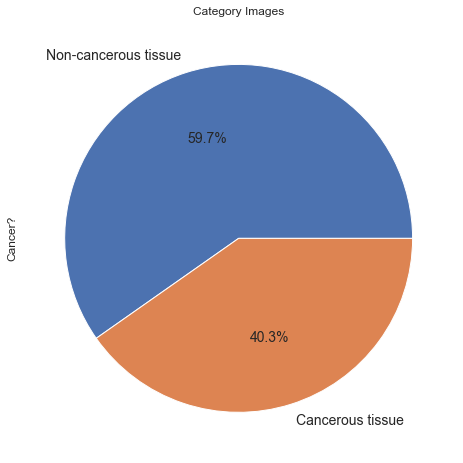

In [21]:
sns.set(style='whitegrid')

pie_chart = pd.DataFrame(full_data_pd['is_cancer'].replace(False,'Non-cancerous tissue').replace(True,'Cancerous tissue').value_counts())

pie_chart.reset_index(inplace=True)

pie_chart.plot(kind = 'pie', 
               title = 'Category Images',
               y = 'is_cancer', 
               autopct = '%1.1f%%', 
               shadow = False, 
               labels = pie_chart['index'], 
               legend = False, 
               ylabel = 'Cancer?',
               fontsize = 14, 
               figsize = (18,8))


As we see our data is unbalanced. Unbalanced data set can lead to the problem is that models trained on unbalanced datasets often have poor results when they have to generalize (predict a class or classify unseen observations). So to avoid this problem we are going to undersample the data to the lowest number which corresponds to 89117 avoiding sidetracked predictions in our future model (As a side effect this is going to make running our model on our laptops easier since originally it took us a lot of time).

Again lets take a look at the given shape of a single random negative image

In [2785]:
single_negative_image = full_data_pd[full_data_pd.is_cancer == False]['image'].sample().iloc[0]

In [2786]:
single_negative_image.shape

(96, 96, 3)

From the shape we can see that our images are 96x96 with three color channels.

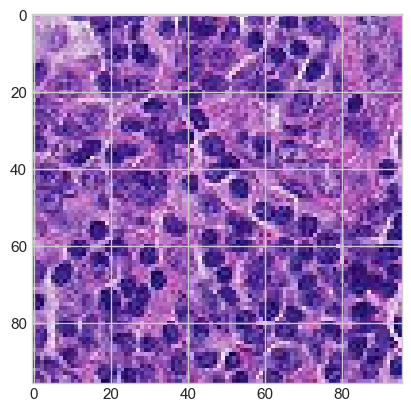

In [2787]:
plt.imshow(single_negative_image)
plt.show()

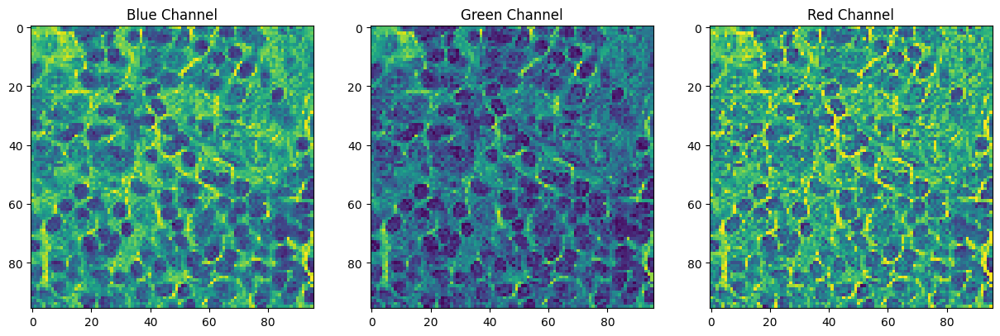

In [2790]:
#Splitting into channels
blue, green, red = cv.split(single_negative_image)

# Plotting the images
fig = plt.figure(figsize = (15, 7.2)) 
fig.add_subplot(131)

plt.title("Blue Channel")
plt.imshow(blue)

fig.add_subplot(132)
plt.title("Green Channel")
plt.imshow(green)

fig.add_subplot(133)
plt.title("Red Channel")
plt.imshow(red)

plt.show()

The differences between the color channels are visible to the naked eye. The green channel is clearly darker than the red and blue channels. The blue channel is darker than the red channnel. This means that the intensity of pixel values for the green channel is lower, closer to 0, then the blue and that in turn is darker than the red channel. 

In [2791]:
random_positive_image = full_data_pd[full_data_pd.is_cancer == True]['image'].sample().iloc[0]

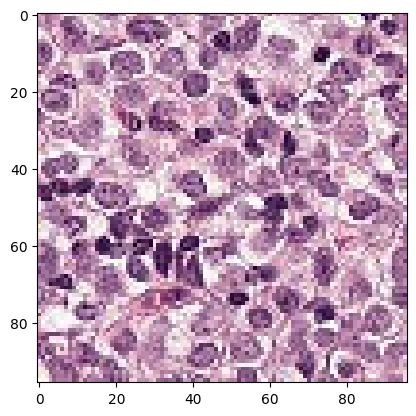

In [2793]:
plt.imshow(random_positive_image)
plt.show()

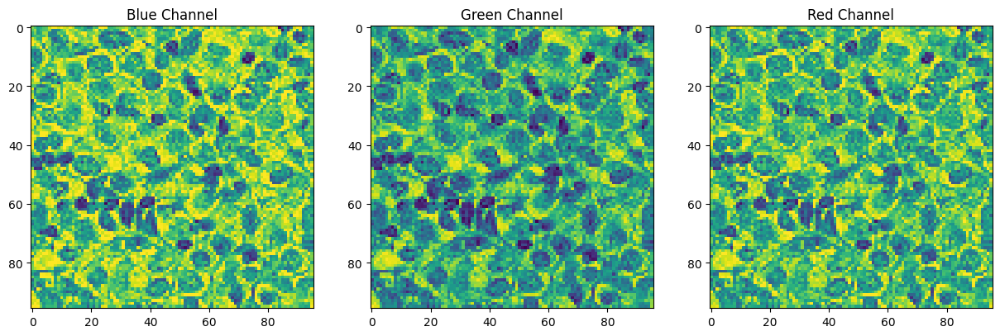

In [2794]:
#Splitting into channels
blue, green, red = cv.split(random_positive_image)

# Plotting the images
fig = plt.figure(figsize = (15, 7.2)) 
fig.add_subplot(131)

plt.title("Blue Channel")
plt.imshow(blue)

fig.add_subplot(132)
plt.title("Green Channel")
plt.imshow(green)

fig.add_subplot(133)
plt.title("Red Channel")
plt.imshow(red)

plt.show()

So we can see a similar pattern for positive images. Intersting to mention, although the hierarchy of color intensity is similar, the green channel for the random positive image is brighter than for the random negative image. Later on we'll look at overall pixel value distribution and try to see if we can spot that as a pattern.

Lets visualy some images and their labels. Since a positive label indicates that the center 32x32px region of a patch contains at least one pixel of tumor tissue we'll circle the 32x32 center with a patch. A blue color for negative and a red color for positive.

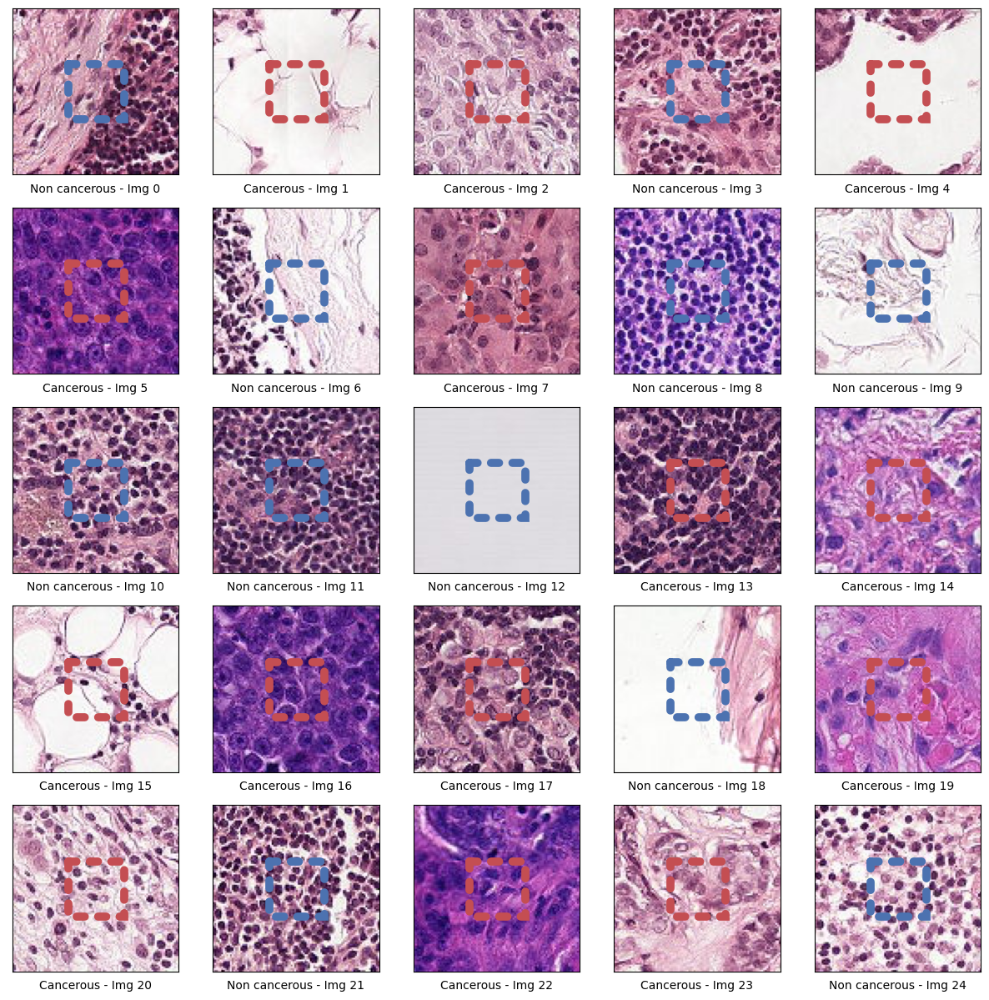

In [2795]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_data = shuffle(full_data_pd, random_state=42)

for (i,current_subplot) in zip(range(25),ax.flat):
    current_row = shuffled_data.iloc[i]
    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        # read image and add to plot
        current_subplot.imshow(current_row['image'])
        
        current_label = current_row['is_cancer']
        
        if (current_label == True):
            current_patch_color = 'r'
            curr_label = 'Cancerous'
        else:
            current_patch_color = 'b'
            curr_label = 'Non cancerous'
        
        # create patch recatangle around the suspected area
        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=current_patch_color, facecolor='none', linestyle=':', capstyle='round')
        
        # add labels and patch 
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()


Using the naked eye, being untrained professionals, we can't make a difference between the cancerous and none cancerous images. Lets explore some more charasteristics of these images to try and spot differences that we can take into consideration when building our model.

In [30]:
stacked_images = np.stack(full_data_pd['image']/255, axis=0)
stacked_positive_images = np.stack(full_data_pd[full_data_pd.is_cancer == True]['image']/255, axis=0)
stacked_negative_images = np.stack(full_data_pd[full_data_pd.is_cancer == False]['image']/255, axis=0)

### Noise analysis

In [31]:
from skimage.restoration import estimate_sigma

We've previously discussed the many ways an histopathological image may be produced of low quality or can be a non tissue image. Let's start investigating the quality of images in our dataset by taking a look at the estimated guassian noise standard deviation of the patch images. At first lets just take a look at a single image and get the sigma for every channel separatly. 

In [32]:
estimate_sigma(single_negative_image,channel_axis=2)

[21.61557335402934, 21.408157141159926, 21.441899186967476]

Noise estimation breakdown by channel for random non cancerous image.

In [33]:
estimate_sigma(single_negative_image, channel_axis=2, average_sigmas=True)

21.48854322738558

The above number is the noise estimation for the non cancerous random image as average of channel sigmas of all color channels.

In [34]:
estimate_sigma(random_positive_image,channel_axis=2)

[17.10980141598165, 16.979481797028164, 17.241426013098266]

Noise estimation breakdown by channel for random cancerous image.

In [35]:
estimate_sigma(random_positive_image, channel_axis=2, average_sigmas=True)

17.110236408702693

The above number is the noise estimation for the cancerous random image as average of channel sigmas of all color channels.

The output above containes the calculated estimated noise separatly per channel, RED, GREEN and BLUE. We can see that the random non cancerous image is more noisy accross all channels, around 27, compared to cancerous image accross all channels, 19. Lets now look at the entire dataset.

In [36]:
noise_all = [estimate_sigma(image, channel_axis=2) for image in stacked_images]
noise_positive = [estimate_sigma(image, channel_axis=2) for image in stacked_positive_images]
noise_negative = [estimate_sigma(image, channel_axis=2) for image in stacked_negative_images]

In [37]:
noise_all_pd = pd.DataFrame(data=noise_all, columns=['Red channel','Green channel','Blue channel'])
noise_positive_pd = pd.DataFrame(data=noise_positive, columns=['Red channel','Green channel','Blue channel'])
noise_negative_pd = pd.DataFrame(data=noise_negative, columns=['Red channel','Green channel','Blue channel'])

Lets an additional column for the average estimation between channnels for each image

In [38]:
noise_all_pd['Overall'] = noise_all_pd.mean(numeric_only=True, axis=1)
noise_positive_pd['Overall'] = noise_positive_pd.mean(numeric_only=True, axis=1)
noise_negative_pd['Overall'] = noise_negative_pd.mean(numeric_only=True, axis=1)

* ### Noise analysis - all images

<AxesSubplot:ylabel='Count'>

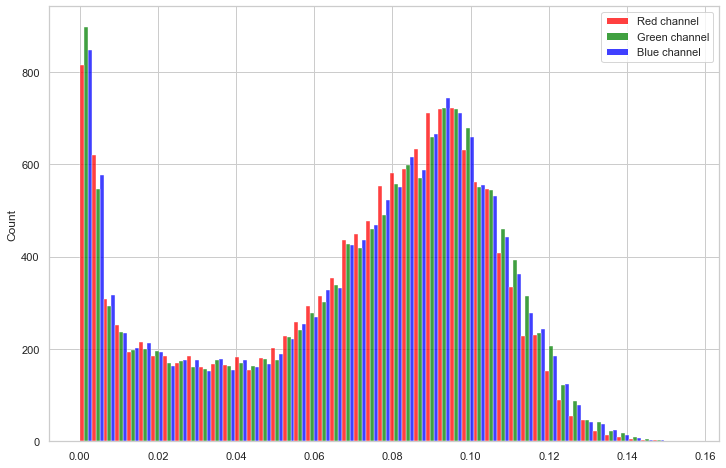

In [39]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=noise_all_pd[['Red channel','Green channel','Blue channel']], stat='count', multiple='dodge', palette=['red', 'green', 'blue'])

The above histogram represents the number of images per amount of noise in the image per channel. The distribution for all color channels has two peaks, one at values very close to 0 and then a second one at around 0.9. We can see that we have quite a lot of images in the dataset with 0 noise.

<AxesSubplot:ylabel='Count'>

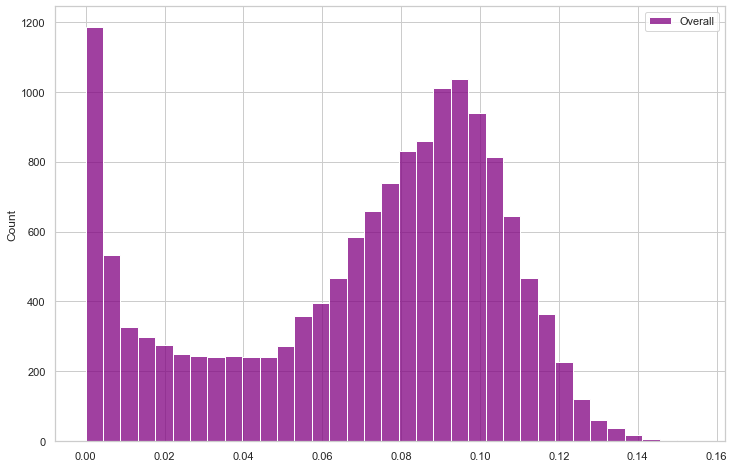

In [40]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=noise_all_pd[['Overall']], stat='count', multiple='dodge', palette=['purple'])

The above histogram represents the number of images per amount of noise in the overall image across channels as an average of the noise in the channels. The distribution is very similar to the distribution with breakdown across channels for all color channels and it has the same two peaks. The numbers are scaled up. We can see that we have quite a lot of images in the dataset with 0 noise. Lets try looking at some of these imasges that their noise is so close to 0 in all channels.

Boolean Series key will be reindexed to match DataFrame index.


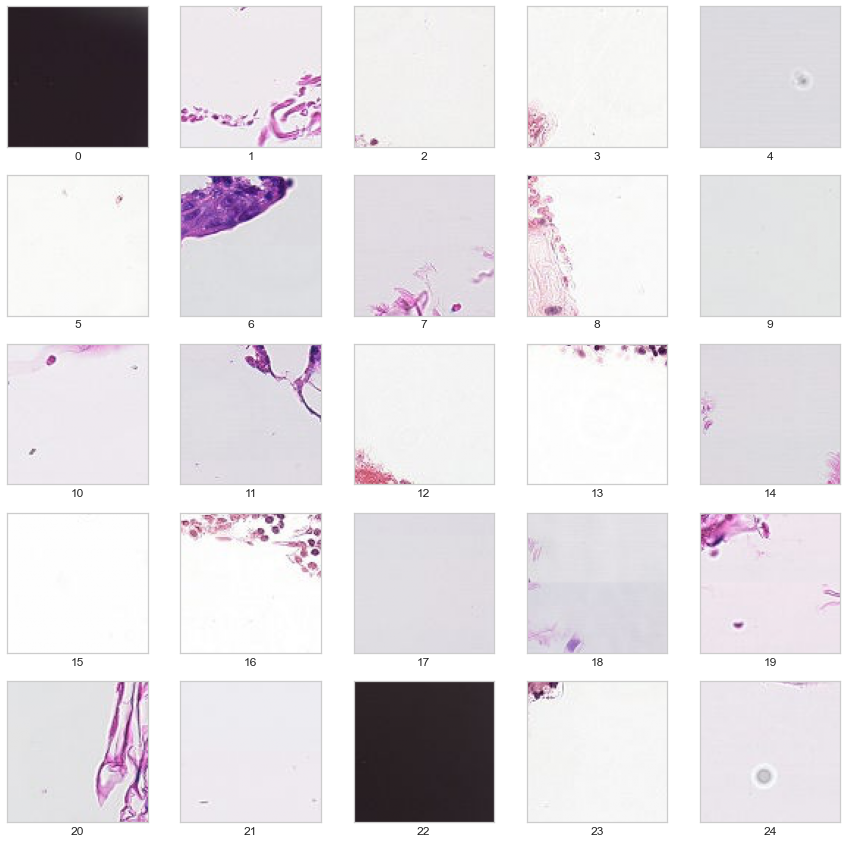

In [41]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_no_noise_data = shuffle(noise_all_pd[noise_all_pd['Red channel'] < 0.001][noise_all_pd['Blue channel'] < 0.001][noise_all_pd['Green channel'] < 0.001], random_state=42)
index_list = shuffled_no_noise_data.head(25).index

for (i, j, current_subplot) in zip(range(25), index_list, ax.flat):    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_images[j])
        current_subplot.xaxis.label.set_text(i)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

We can see from the images that these are faulty histopathological image scans. These can arise from various errors in the process of sample collection, from the collection of the sample and up untill the imaging digitilization (Galton, Fouad, Landini and Randell, 2017). We will have to filter these images since they will not contribute to our model. It seems that the peak of images with almost no noise represent fauly images in our dataset, patches that do not have any tissue, from the very edge of WSI or from bad scans. But looking at the noise channels separatly may leave some images that have a very low (or high) rate of noise but one of their channels is now that skewed in value. Lets visualise some of the images with very low overall values

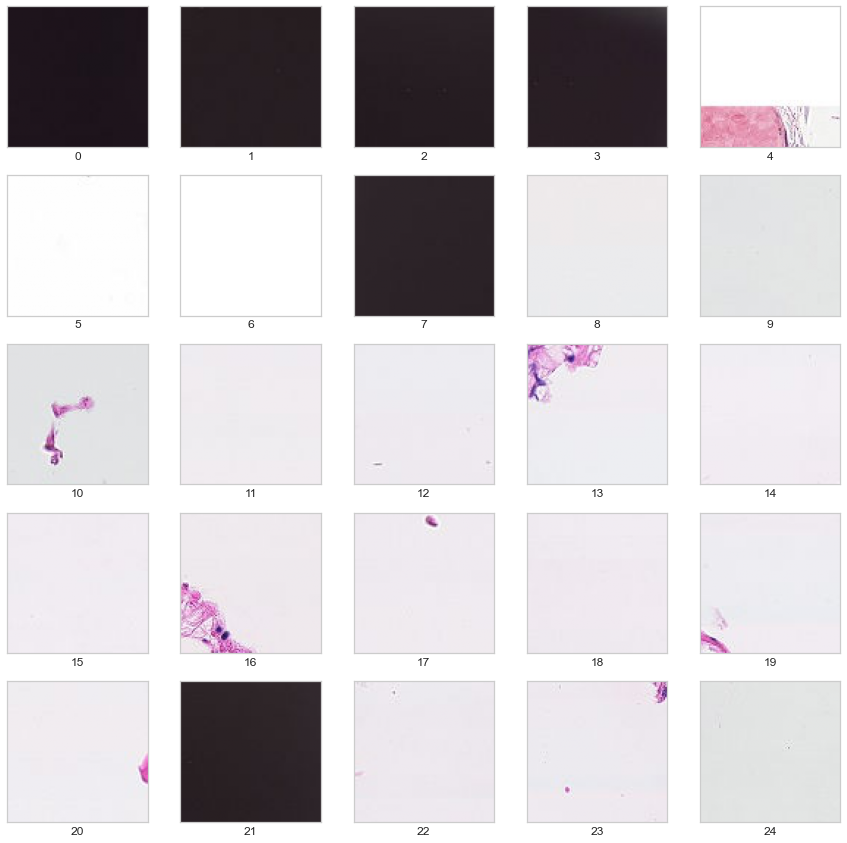

In [42]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

no_noise_data = noise_all_pd[noise_all_pd['Overall'] < 0.001].sort_values('Overall',  ascending=True).head(25)
index_list = no_noise_data.index

for (i, j, current_subplot) in zip(range(25), index_list, ax.flat):    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_images[j])
        current_subplot.xaxis.label.set_text(i)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

The above images represent images with very low overall noise across all chanells. We again see images that either do not contain any tissue. Lets discuss some specific examples. 
* Completly dark image - image 0-3, 7, 21 - this may have been caused by the microscope not working correctly
* Partial scan - image 4 - sliced in the first quarter
* Completly white - images 5,6 - might have been caused by a problem with the digitalisation equipement

Lets see if there are some images that have an overall low noise rate but didn't fall into our breakdown of noise by channels.

In [43]:
noise_all_pd[noise_all_pd['Red channel'] < 0.001][noise_all_pd['Blue channel'] < 0.001][noise_all_pd['Green channel'] < 0.001].count()

Boolean Series key will be reindexed to match DataFrame index.


Red channel      269
Green channel    269
Blue channel     269
Overall          269
dtype: int64

In [44]:
noise_all_pd[noise_all_pd['Overall'] < 0.001].count()

Red channel      278
Green channel    278
Blue channel     278
Overall          278
dtype: int64

For the above counts we can see that we do indeed have some images with an overall low noise rate that do not have an extremly low noise rate in all channels. These are 9 images in total. 

In [45]:
merged_df = noise_all_pd[noise_all_pd['Overall'] < 0.001].merge(noise_all_pd[noise_all_pd['Red channel'] < 0.001][noise_all_pd['Blue channel'] < 0.001][noise_all_pd['Green channel'] < 0.001], how = 'left', indicator = True)

Boolean Series key will be reindexed to match DataFrame index.


In [46]:
merged_df[merged_df['_merge'] != 'both']

,Red channel,Green channel,Blue channel,Overall,_merge
45,4.607511e-04,1.648268e-03,0.000629,0.000913,left_only
46,7.267658e-04,7.267658e-04,0.001161,0.000872,left_only
57,2.909778e-17,2.909778e-17,0.001791,0.000597,left_only
72,7.267658e-04,1.258795e-03,0.000727,0.000904,left_only
102,1.090149e-03,9.927805e-04,0.000727,0.000937,left_only
132,9.927805e-04,8.241339e-04,0.001019,0.000945,left_only
192,5.320295e-04,5.546238e-04,0.001064,0.000717,left_only
202,1.005825e-03,9.927805e-04,0.000993,0.000997,left_only
219,1.018870e-03,9.927805e-04,0.000922,0.000978,left_only


In the above table we can see all images with a relativly low noise rate accross all channels, lower than our threshold of 0.001. All 9 images have an extremly low noise rate in the red and green channels and a higher noise rate in the blue channel creating the skew in calculation. Let's look at these images

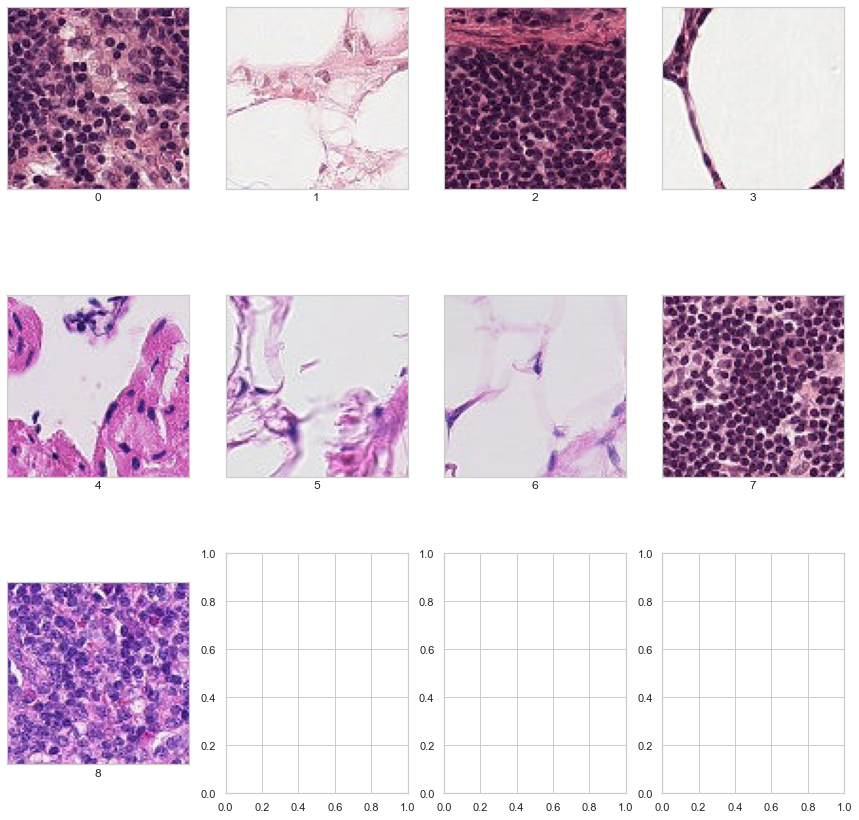

In [47]:
fig, ax = plt.subplots(3, 4, figsize=(15,15))

merged_data = merged_df[merged_df['_merge'] != 'both']
index_list = merged_data.index

for (i, j, current_subplot) in zip(range(len(merged_df)), index_list, ax.flat):
    current_row = merged_data.iloc[i]
    
    plt.subplot(3,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_images[j])
        current_subplot.xaxis.label.set_text(i)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

The above presented images have an overall low noise rate, but not a low noise rate across all channels.
Interestingly enough, when one of the channels, has higher noise rates, the images do not look as corrupt or irrelevant to our untrained eye, even when the rest of channels have noise rates close to 0.

Based on this we could say that an indicator for a corrupt image would be a low noise rate in all channels and not an overall average of noise across all channels. From now on we'll look at the noise rate for all channels and not at the overall average.

In [48]:
print("Upper percentile of noise for the different channels for all images")
print(f"Green {np.percentile(noise_all_pd['Green channel'].values, 99.9)}")
print(f"Blue {np.percentile(noise_all_pd['Blue channel'].values, 99.9)}")
print(f"Red {np.percentile(noise_all_pd['Red channel'].values, 99.9)}")
print("")
print("Lower percentile of noise for the different channels for all images")
print(f"Green {np.percentile(noise_all_pd['Green channel'].values, 0.1)}")
print(f"Blue {np.percentile(noise_all_pd['Blue channel'].values, 0.1)}")
print(f"Red {np.percentile(noise_all_pd['Red channel'].values, 0.1)}")

Upper percentile of noise for the different channels for all images
Green 0.14156360991563674
Blue 0.14109693764010522
Red 0.1389478843662815

Lower percentile of noise for the different channels for all images
Green 4.5686208131758186e-33
Blue 2.2843104065879093e-33
Red 5.707349550859893e-33


The above calculations represent the upper and lower percentiles of estimated noise for each channel in all images.

Lets try looking at some of these images with a high noise rate per channel in all channels.

Boolean Series key will be reindexed to match DataFrame index.


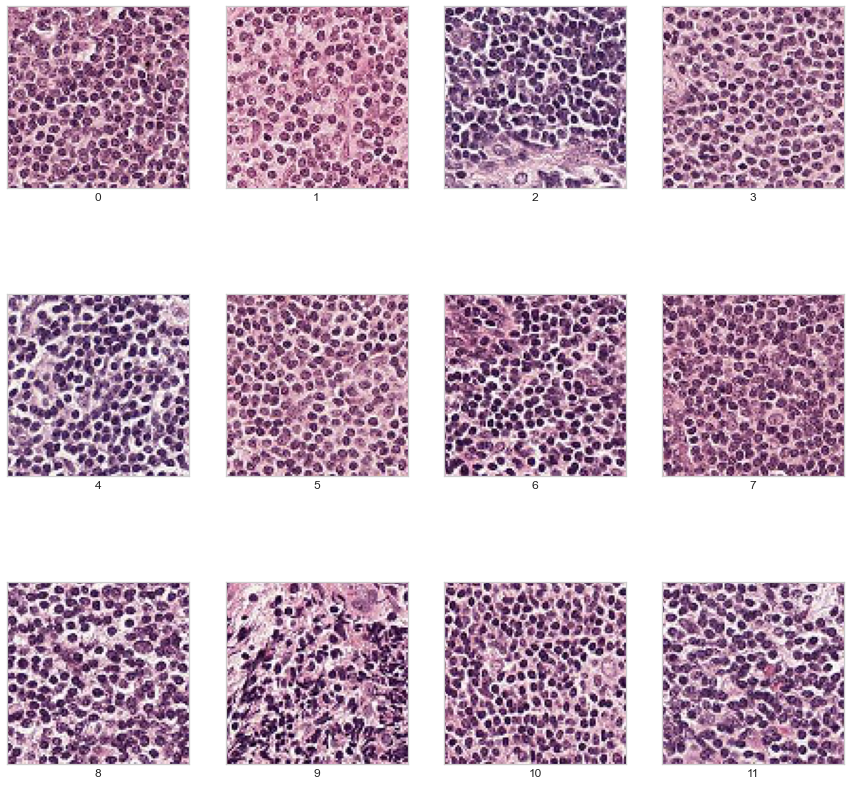

In [49]:
fig, ax = plt.subplots(3, 4, figsize=(15,15))
                                                                                       
shuffled_no_noise_data = shuffle(noise_all_pd[noise_all_pd['Green channel'] > np.percentile(noise_all_pd['Green channel'].values, 99.9)][noise_all_pd['Red channel'] > np.percentile(noise_all_pd['Red channel'].values, 99.9)][noise_all_pd['Blue channel'] > np.percentile(noise_all_pd['Blue channel'].values, 99.9)], random_state=42)
index_list = shuffled_no_noise_data.head(12).index

for (i, j, current_subplot) in zip(range(12), index_list, ax.flat):    
    plt.subplot(3,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_images[j])
        current_subplot.xaxis.label.set_text(i)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

Looks like all of these images have a lot of dark dots. From what we saw at the [histology guide](https://www.histology.leeds.ac.uk/), these patches might come from connective tissue like reticular fibre. As we have very limited domainn knowledge, we can't say if this type of tissue is relevant to our classification problem or not, and so we're going to leave thse images and not filter them out. 

Now lets look at the noise in negative versus positive images.

* ### Noise analysis - cancerous images

<AxesSubplot:ylabel='Count'>

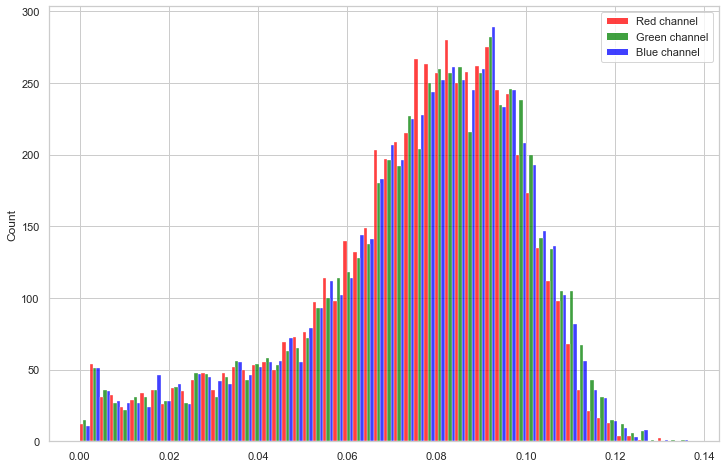

In [50]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=noise_positive_pd[['Red channel','Green channel','Blue channel']], stat='count', multiple='dodge', palette=['red', 'green', 'blue'])

The above histogram represents the number of images per amount of noise in the cancerous images only. The distribution is slightly skewed right with a single peak around ,0.8-0.10. There aren't many images with almost no noise in all the channels like in the general distribution. We can already assume most of the non noise images are coming from the negative images. 

In [51]:
print("Upper percentile of noise for the different channels for positive images")
print(f"Green {np.percentile(noise_positive_pd['Green channel'].values, 99.9)}")
print(f"Blue {np.percentile(noise_positive_pd['Blue channel'].values, 99.9)}")
print(f"Red {np.percentile(noise_positive_pd['Red channel'].values, 99.9)}")
print("")
print("Lower percentile of noise for the different channels for positive images")
print(f"Green {np.percentile(noise_positive_pd['Green channel'].values, 0.1)}")
print(f"Blue {np.percentile(noise_positive_pd['Blue channel'].values, 0.1)}")
print(f"Red {np.percentile(noise_positive_pd['Red channel'].values, 0.1)}")

Upper percentile of noise for the different channels for positive images
Green 0.12636251806415907
Blue 0.12531208348595932
Red 0.1228774645601443

Lower percentile of noise for the different channels for positive images
Green 0.0010166976466731935
Blue 0.0011624185349239746
Red 0.0010102890762809934


Interestingly enought the lower percentile (0.1) of noise values for the cancerous images is higher than the general value of the same percenntile. The upper percentile (99.9) of noise vales for the cancerous images is lower than the general value of the same percentile. Lets take a look at some of the images with almost no noise in all channels.

Boolean Series key will be reindexed to match DataFrame index.


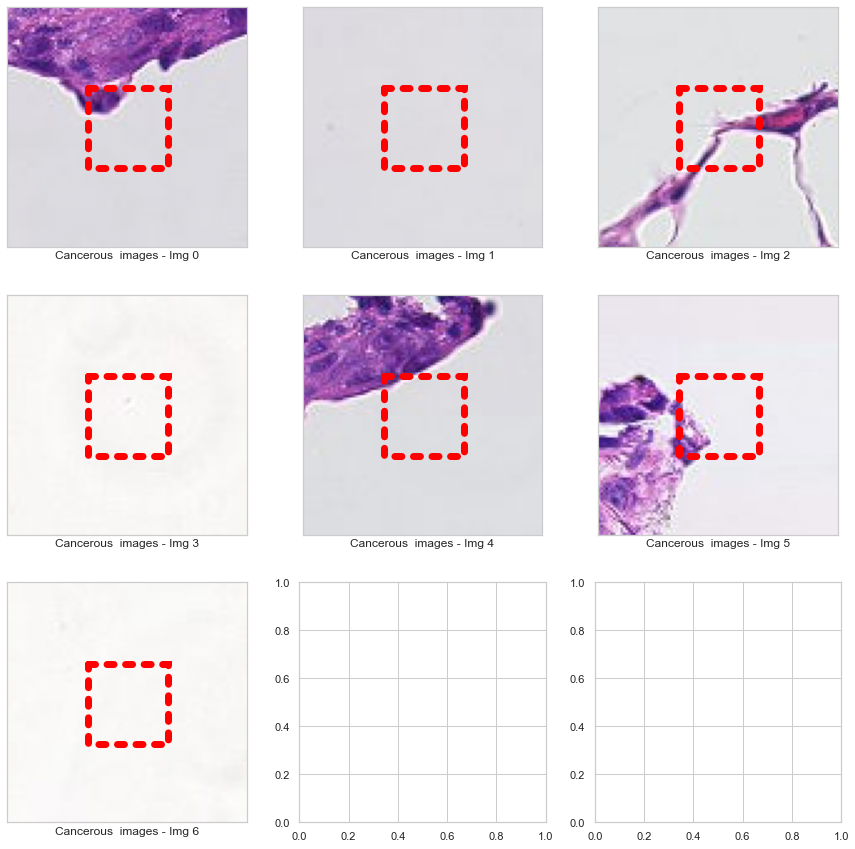

In [52]:
fig, ax = plt.subplots(3, 3, figsize=(15,15))
                                                                                       
shuffled_no_noise_data = shuffle(noise_positive_pd[noise_positive_pd['Green channel'] <= np.percentile(noise_positive_pd['Green channel'].values, 0.1)][noise_positive_pd['Red channel'] <= np.percentile(noise_positive_pd['Red channel'].values, 0.1)][noise_positive_pd['Blue channel'] <= np.percentile(noise_positive_pd['Blue channel'].values, 0.1)], random_state=42)
index_list = shuffled_no_noise_data.index

for (i, j, current_subplot) in zip(range(len(shuffled_no_noise_data)), index_list, ax.flat):    
    plt.subplot(3,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_positive_images[j])

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor='red', facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"Cancerous  images - Img {i}")
        current_subplot.add_patch(box)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

The above images represent patches classified as cancerous that have a low noise rate across all channels. Lets discuss some examples.
* Staining or partial tissue - images 0,2,4,5 - look like they contain either stains used in processing  of the tissues or very partial fragments of tissue. In all of these images some parts of the stain fall into the inner rectangle, that is responsible for the classification. 
* Very light frames - images 1,3,6 - these do not contain any tissue at all. Might come for the very edge of the scan or WSI or indicate a problem with the microscope. The inner rectangle emphasises there cannot be any cancerous tissue. 

Looking at the points mentioned, looks like overall all of these images were classified as cancerous incorrectly. This again emphasises the fact that images with low noise rate across all channels hep indicate faulty images. 

We will not filter the images at the moment since we first want to explore their contrast rates and brightness. We'l first do that and see if we can find a better filter indicator in term of contrast rates.

Lets now look at the non cancerous images noise distribution across channels.

* ### Noise analysis - non cancerous images

<AxesSubplot:ylabel='Count'>

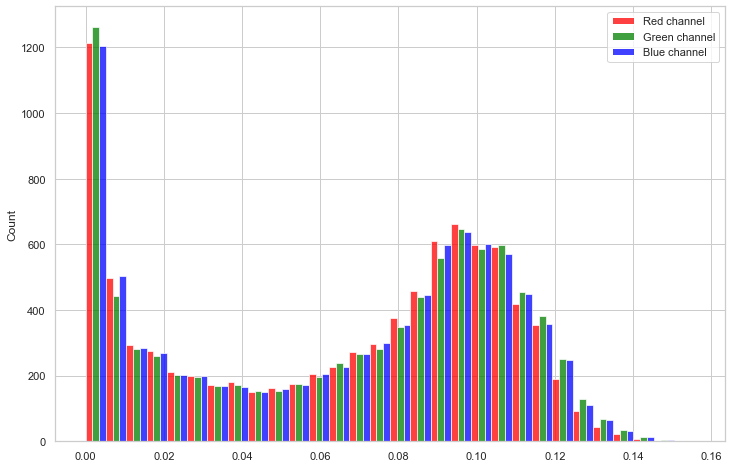

In [55]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=noise_negative_pd[['Red channel','Green channel','Blue channel']], stat='count', multiple='dodge', palette=['red', 'green', 'blue'])

The above histogram represents the number of images per amount of noise in the non cancerous images only. The distribution has two peaks, similar to the general distribution. The first and upper peak is of the values very close to 0, the second peak is of noise values around 0.09 - 0.1. Lets look at their upper and lower percentile values.

In [56]:
print("Upper percentile of noise for the different channels for positive images")
print(f"Green {np.percentile(noise_negative_pd['Green channel'].values, 99.9)}")
print(f"Blue {np.percentile(noise_negative_pd['Blue channel'].values, 99.9)}")
print(f"Red {np.percentile(noise_negative_pd['Red channel'].values, 99.9)}")
print("")
print("Lower percentile of noise for the different channels for positive images")
print(f"Green {np.percentile(noise_negative_pd['Green channel'].values, 0.1)}")
print(f"Blue {np.percentile(noise_negative_pd['Blue channel'].values, 0.1)}")
print(f"Red {np.percentile(noise_negative_pd['Red channel'].values, 0.1)}")

Upper percentile of noise for the different channels for positive images
Green 0.144025205471563
Blue 0.14309078521187193
Red 0.1404670605086587

Lower percentile of noise for the different channels for positive images
Green 1.1421552032939546e-33
Blue 2.238624198456152e-33
Red 2.2843104065879093e-33


From both the distribution and the upper and lower percentile values we can see that the non cancerous images are responsible for the most of the extreme values for images in the dataset.

Boolean Series key will be reindexed to match DataFrame index.


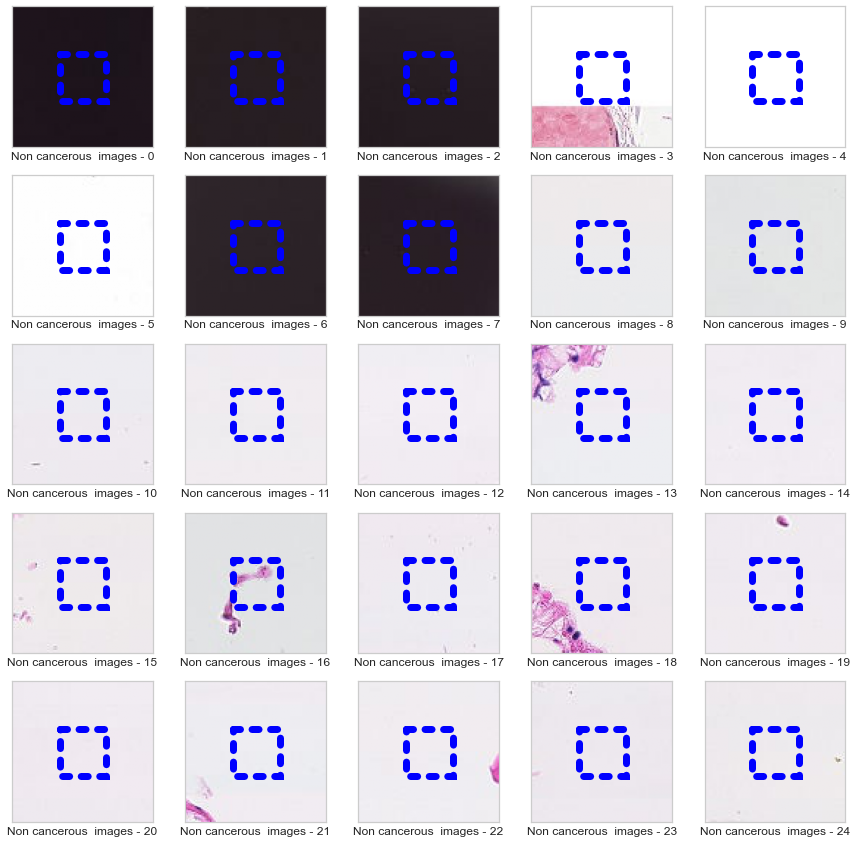

In [57]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_negative_no_noise_data = noise_negative_pd[noise_negative_pd['Red channel'] < 0.001][noise_negative_pd['Blue channel'] < 0.001][noise_negative_pd['Green channel'] < 0.001].sort_values(['Red channel','Blue channel','Green channel'], ascending = True).head(25)
index_list = shuffled_negative_no_noise_data.index

for (i, j, current_subplot) in zip(range(25), index_list, ax.flat):    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        current_subplot.imshow(stacked_negative_images[j])
        
        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor='blue', facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"Non cancerous  images - {i}")
        current_subplot.add_patch(box)    
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

The above images represent the non cancerous images with the lowest noise rates per each channel. The blue rectangle in the middle represents the 36x36 patch upon which the classification was made.
* Black images - images 0,1,2,6,7 - this may have been caused by the microscope not working correctly
* Partial scan - image 3 - sliced in the first quarter
* Very light monotonous immages - images 4,5,10,11,12,17,20 - might have been caused by a problem with the digitalisation equipement or images taken from the very edge of the WSI

Overall we can see that there is no substainale tissue in the blue rectangle range across all images, we can safely assume the classification was made incorrectly - eg this is non cancerous tissue, but there was no actual tissue  examed.

### Exploring image pixel values distribution

Let's now visualise and explore the different values of our pixels to see if we can find more explanations to the different intensities in colors for a single cancerous and a single non cancerous image, and the differences in noise values.

Reshaping our image array in such a way it'll be easier to visualize. 

In [58]:
stacked_negative_images = np.stack(full_data_pd[full_data_pd['is_cancer'] == False]['image'], axis=0)
stacked_positive_images = np.stack(full_data_pd[full_data_pd['is_cancer'] == True]['image'], axis=0)

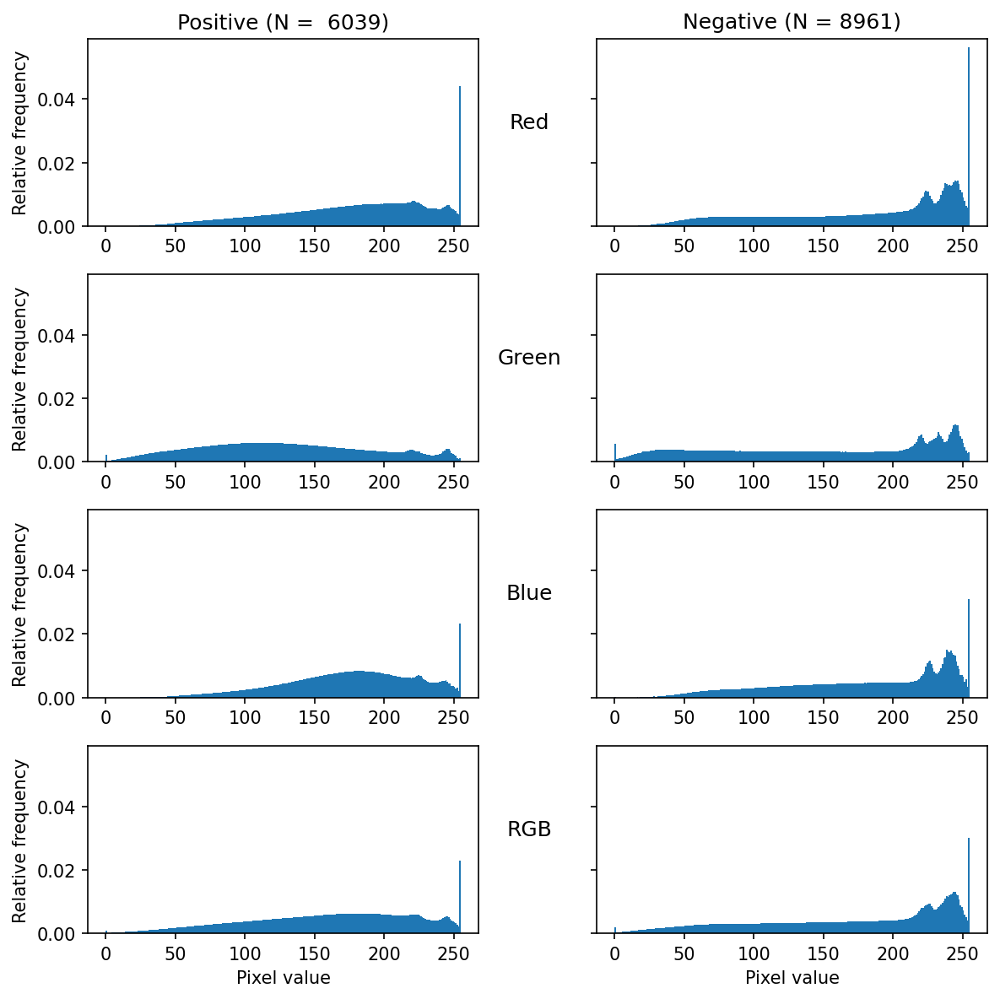

In [2789]:
plt.rcParams.update(plt.rcParamsDefault)

fig, axs = plt.subplots(4, 2, sharey=True, figsize=(8,8), dpi=150)

#RGB channels

# RED channel
axs[0,0].hist(stacked_positive_images[:,:,:,0].flatten(), bins=256, density=True, )
axs[0,1].hist(stacked_negative_images[:,:,:,0].flatten(), bins=256, density=True)

# GREEN channel
axs[1,0].hist(stacked_positive_images[:,:,:,1].flatten(), bins=256, density=True)
axs[1,1].hist(stacked_negative_images[:,:,:,1].flatten(),  bins=256, density=True)

# BLUE Channel
axs[2,0].hist(stacked_positive_images[:,:,:,2].flatten(), bins=256, density=True)
axs[2,1].hist(stacked_negative_images[:,:,:,2].flatten(), bins=256, density=True)

#All channels
axs[3,0].hist(stacked_positive_images.flatten(), bins=256, density=True)
axs[3,1].hist(stacked_negative_images.flatten(), bins=256, density=True)

#Set image labels
axs[0,0].set_title("Positive (N =  " + str(stacked_positive_images.shape[0]) + ")");
axs[0,1].set_title("Negative (N = " + str(stacked_negative_images.shape[0]) + ")");

axs[0,1].set_ylabel("Red",rotation='horizontal',labelpad=35,fontsize=12)
axs[1,1].set_ylabel("Green",rotation='horizontal',labelpad=35,fontsize=12)
axs[2,1].set_ylabel("Blue",rotation='horizontal',labelpad=35,fontsize=12)
axs[3,1].set_ylabel("RGB",rotation='horizontal',labelpad=35,fontsize=12)

for i in range(4):
    axs[i,0].set_ylabel("Relative frequency")
    
axs[3,0].set_xlabel("Pixel value")
axs[3,1].set_xlabel("Pixel value")

fig.tight_layout()

plt.show()

Looking at these plots we can notice several interesting differences between cancerous and non cancerous samples.

* In general looks like there is a peak of very saturated images (250 pixel value frequenncy, white). We cann see the frequency peak for blue and red channels, for both cancerous and non cancerous images, and also for all colors all together (RGB). Some of the images with no noise at all that we've seen were very bright indeed so some of these numbers can be explained by the non noisey images we've seen before.
* There are no such peak only for the green channel in both cancerous and non cancerous images.
* Non cancerous images seem to be more saturated, higher values more frequent, than cancerous images.
* Cancerous images tend to have lower frequency values for the green channel, meaning the green color in the is less saturated, compared to the reds and blues which are brighter and more dominant. This is very interesting since  as stated before, when a pathologist looks at a biopsy of a suspected cancer, the histological section is likely to be stained with a combination of hematoxylin and eosin, it produces blues, violets and reds (Fox, 2000; Krithiga & Geetha, 2020).
* Non cancerous images have more saturated pixel value frequency for all color channels.
* Non cancerous images have a small peak for 0 pixel value in the overall distribution. This might also be explained by the faulty images we've seen earlier.

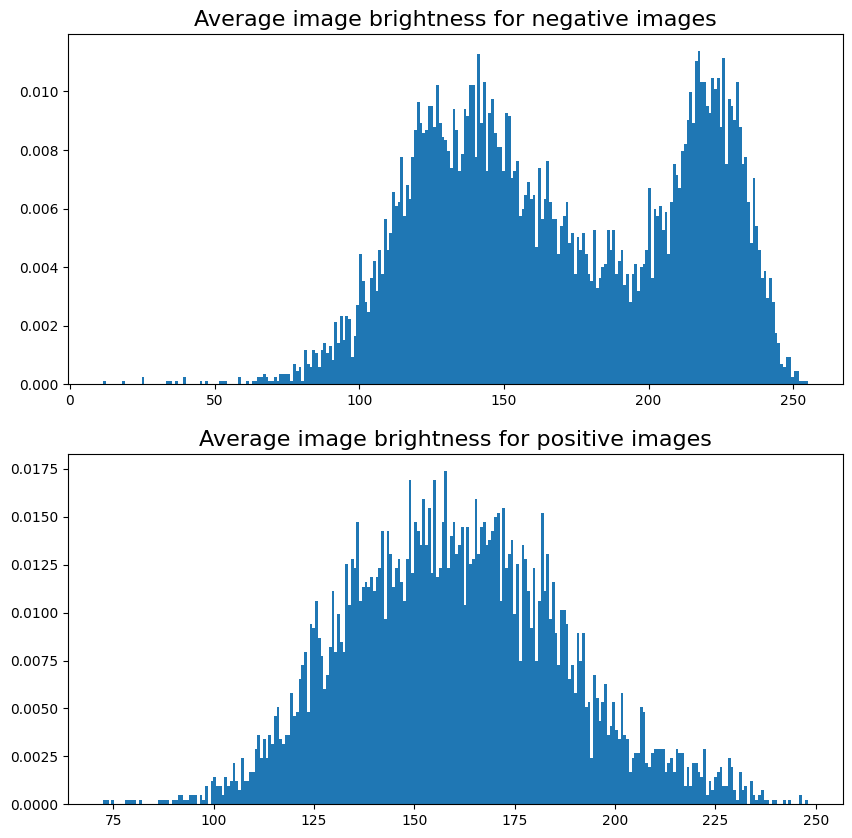

In [257]:
plt.rcParams.update(plt.rcParamsDefault)

fig, ax = plt.subplots(2,1,figsize=(10,10))

ax[0].hist(np.mean(stacked_negative_images, axis=(1,2,3)), bins=256, density=True)
ax[1].hist(np.mean(stacked_positive_images, axis=(1,2,3)), bins=256, density=True)

ax[0].set_title("Average image brightness for negative images", fontsize=16)
ax[1].set_title("Average image brightness for positive images", fontsize=16)

plt.show()

Interestingly enough we can see that there is a difference in image brightness between cancerous and non cancerous images.
* Cancerous images have a normal like distribution of image brightness.
* Non cancerous images have a multimodal distribution of image brightness. 

### Exploring low/high contract images

In [61]:
from skimage.exposure import is_low_contrast

In [62]:
def is_low_contrast_func(image, fraction_threshold):
    return bool(is_low_contrast(image, fraction_threshold=fraction_threshold))

In [63]:
low_contrast_pd = full_data_pd.copy()
low_contrast_pd['is_low_contrast'] = low_contrast_pd['image'].apply(is_low_contrast_func, fraction_threshold=0.2)

We've decided to set the fraction_threshold to 0.2 after experimenting and looking at the different images on the different thresholds set. We'll explore more of them now.

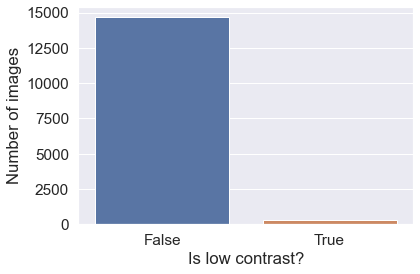

In [249]:
ax = sns.countplot(data=low_contrast_pd, x='is_low_contrast')
ax.set(xlabel='Is low contrast?', ylabel='Number of images')
plt.show()

The bar plot above reflects how any images in our data set  are with a low contrast rate. Looks like most of our images are not low contrast. This corresponds with what we've seen earlier in regards to the amount of noise in the image, a lot of images with low noise rates are also low contrast and monotoneus. Lets deep dive into the images that are low contrast.

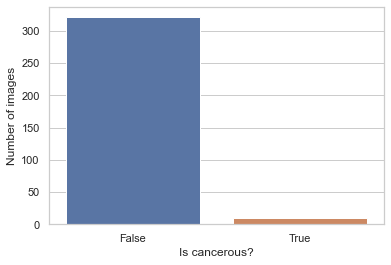

In [65]:
ax = sns.countplot(data=low_contrast_pd[low_contrast_pd['is_low_contrast'] == True], x='is_cancer')
ax.set(xlabel='Is cancerous?', ylabel='Number of images')
plt.show()

In the count plot above we can see that of the low contrast images, most of the images are of non cancerous tissue. This again corresponds with what we've seen before in regards to the images with the noise. Images with extremly low amounts of noise, that are very dark or very white, have no contrasting other color and so are of very low contrast.

In [66]:
low_contrast_pd[low_contrast_pd['is_low_contrast'] == True].groupby(['is_cancer']).count()

,id,file_name,image,is_low_contrast
is_cancer,,,,
False,321,321,321,321
True,9,9,9,9


 To be more precise, we have 9 cancerous low contrast images and 321 non cancerous. Let's take a look at the images at hand 

Boolean Series key will be reindexed to match DataFrame index.


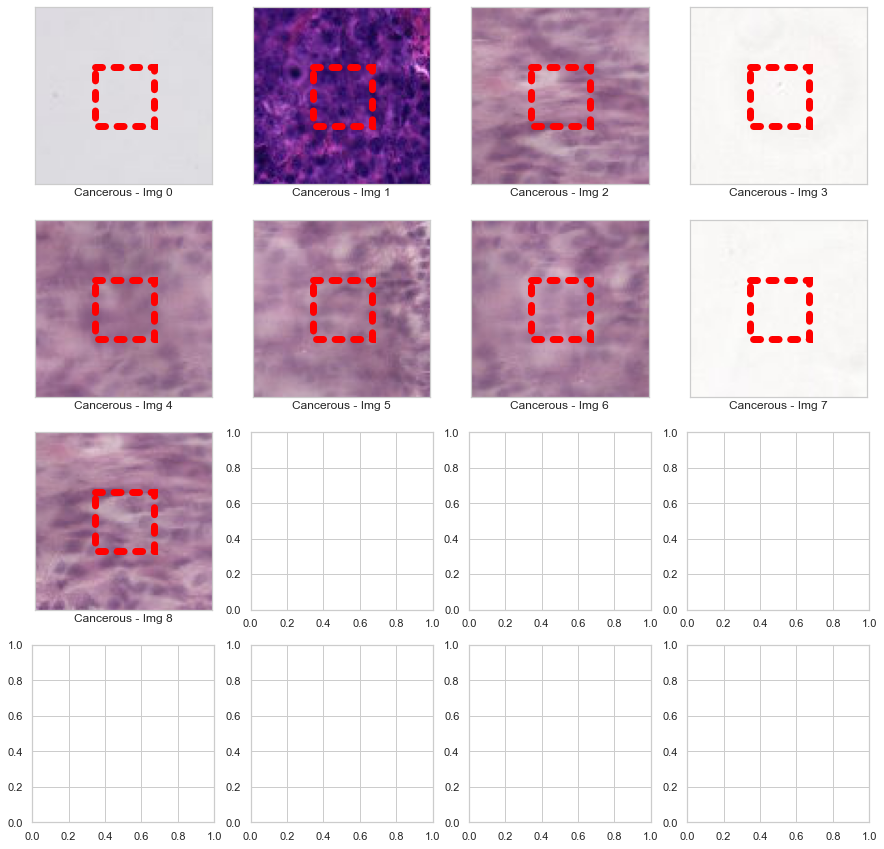

In [67]:
fig, ax = plt.subplots(4, 4, figsize=(15,15))

shuffled_low_contrast = low_contrast_pd[low_contrast_pd["is_low_contrast"] == True][low_contrast_pd['is_cancer'] == True]

for i, current_subplot in zip(range(len(shuffled_low_contrast)), ax.flat):
    try:
        current_row = shuffled_low_contrast.iloc[i]

        plt.subplot(4,4,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
    
        current_subplot.imshow(current_row['image'])

        curr_label = 'Non cancerous'
        edgecolor='blue'
        
        if current_row['is_cancer']:
            curr_label = 'Cancerous'
            edgecolor='red'

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=edgecolor, facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box) 
    except IndexError as e:
        None
plt.show()

The above images are the cancerous images with low contrast. 
* Light and monotonous - immages 0,3,7 - seems like thse images don't contain any tissue at all. This could reflect the very edge of the scanner or a problem with the digitilization process.
* Blurry tussie immages - the rest - these images almost look as if they did have tissues scanned,  but the scanned image is very blurry. This again could reflect the very edge of the scanner or a problem with the digitilization process

Overall we believe it's safe to assume these were falsly clasified as cancerous. 

Let's look at the non cancerous images.

Boolean Series key will be reindexed to match DataFrame index.


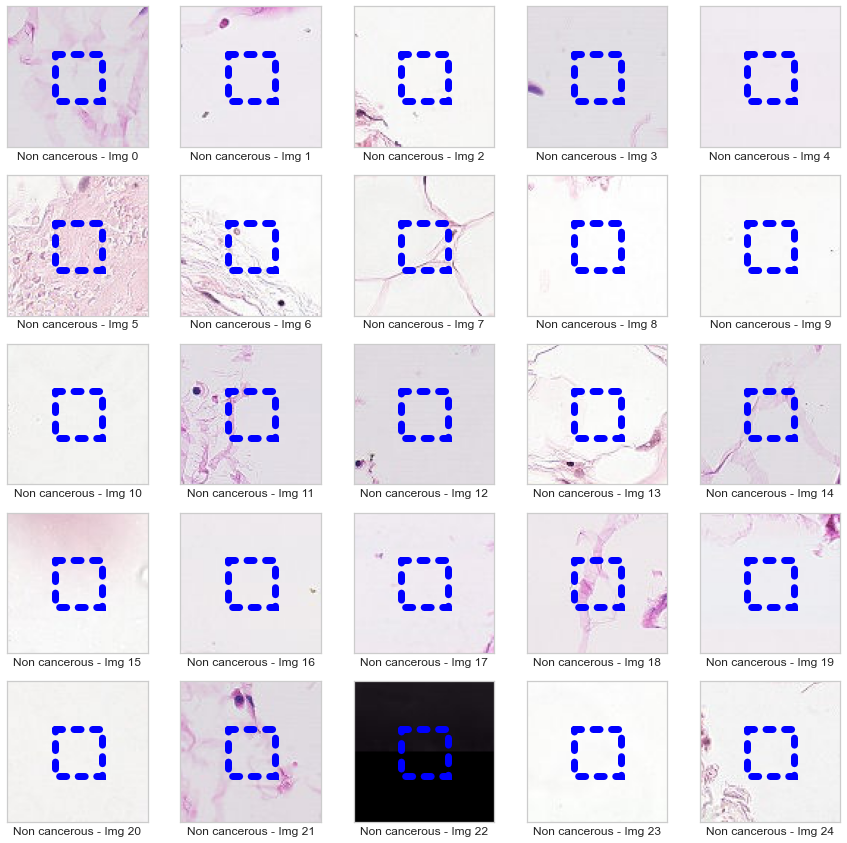

In [68]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_low_contrast = shuffle(low_contrast_pd[low_contrast_pd["is_low_contrast"] == True][low_contrast_pd['is_cancer'] == False], random_state=24).head(25)

for i, current_subplot in zip(range(len(shuffled_low_contrast)), ax.flat):
    try:
        current_row = shuffled_low_contrast.iloc[i]

        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
    
        current_subplot.imshow(current_row['image'])

        curr_label = 'Non cancerous'
        edgecolor='blue'
        
        if current_row['is_cancer']:
            curr_label = 'Cancerous'
            edgecolor='red'

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=edgecolor, facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box) 
    except IndexError as e:
        None
plt.show()

The images presented above have a low contrast rate and are classified as non cancerous. We can observe several problems with these images.
* Completly black or white images - 9,10,22
* Slight hue or no tissue - the rest of the images effectevly have somme slight lines and colors, that do not look like substaintial tissue. These can come from various faults in scanning; from the edges of the WSI, blurred tissue images etc.

Overall looking at the 36x36 rectangle, we can see no substantial information there that could contribute to the classification of these images.

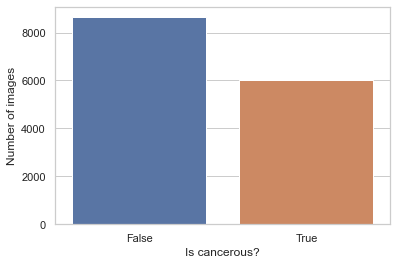

In [70]:
ax = sns.countplot(data=low_contrast_pd[low_contrast_pd["is_low_contrast"] == False], x='is_cancer')
ax.set(xlabel='Is cancerous?', ylabel='Number of images')
plt.show()

The bar plot above shows the count of images classified as cancerous and non cancerous after filtering out the low contrast images. 

Observing the low contrast images, we've seen  some problems similar to the low noise images. Let's observe the com bination between the two and filter out this faulty data according to the best critirea. Keepinng them can potentially ruin the model because the falsly classify images.

#### Which is the better filter? Noise estimation vs contrast

Lets add the low noise indicator as we've calculated before to our data.

In [71]:
green_pos_p = np.percentile(noise_positive_pd['Green channel'].values, 0.1)
red_pos_p = np.percentile(noise_positive_pd['Red channel'].values, 0.1)
blue_pos_p = np.percentile(noise_positive_pd['Blue channel'].values, 0.1)

green_neg_p = np.percentile(noise_negative_pd['Green channel'].values, 5)
red_neg_p = np.percentile(noise_negative_pd['Red channel'].values, 5)
blue_neg_p = np.percentile(noise_negative_pd['Blue channel'].values, 5)

We've used a different threshold for the percentile because of the amount of images and their distribution as seen before.

In [72]:
def is_low_noise(image, is_cancer):
    (red, green, blue) = estimate_sigma(image, channel_axis=2)
    
    if (is_cancer):
        if (red <= red_pos_p and 
            green <= green_pos_p and  
            blue <= blue_pos_p):
            return True
        else:
            return False
    if (red <= red_neg_p and 
        green <= green_neg_p and  
        blue <= blue_neg_p):
        return True
    return False
    

In [73]:
low_contrast_pd['low_noise'] = low_contrast_pd[['image','is_cancer']].apply(lambda x: is_low_noise(x['image'],x['is_cancer']), axis=1)

In [74]:
low_contrast_pd.pivot_table('is_cancer', index='is_low_contrast', columns='low_noise', aggfunc='count')

low_noise,False,True
is_low_contrast,,
False,14657,13
True,258,72


The above pivot table represents the match of boolean values between the two indicators, low contrast (is_low_contrast) and low noise (low_noise). We can see that most of our images, are both now low on noise and not low on contrast. This makes a lot of sense with what we've seen previously. 

* 13 of our images are low on noise but not low on contrast. This can be reflected in faulty images that have some texture like partial scans or partial tissue, these would not be low contrast but as we've seen, low on noise.  
* 258 of our images are low on contrast but not low on noise. This  can be reflected in faulty images that have some blurry tissue or some tissue from the edge of the scan. These would  be low on contrast, but not low enough on noise to cut the threshold. 
* 72 of our images are low on noise and on contrast. This can be reflected in faulty images as a result of bad microscope scan, images that are homogenous in color and have almost no to no tissue at all.

Lets explore the different combinations. 

Boolean Series key will be reindexed to match DataFrame index.


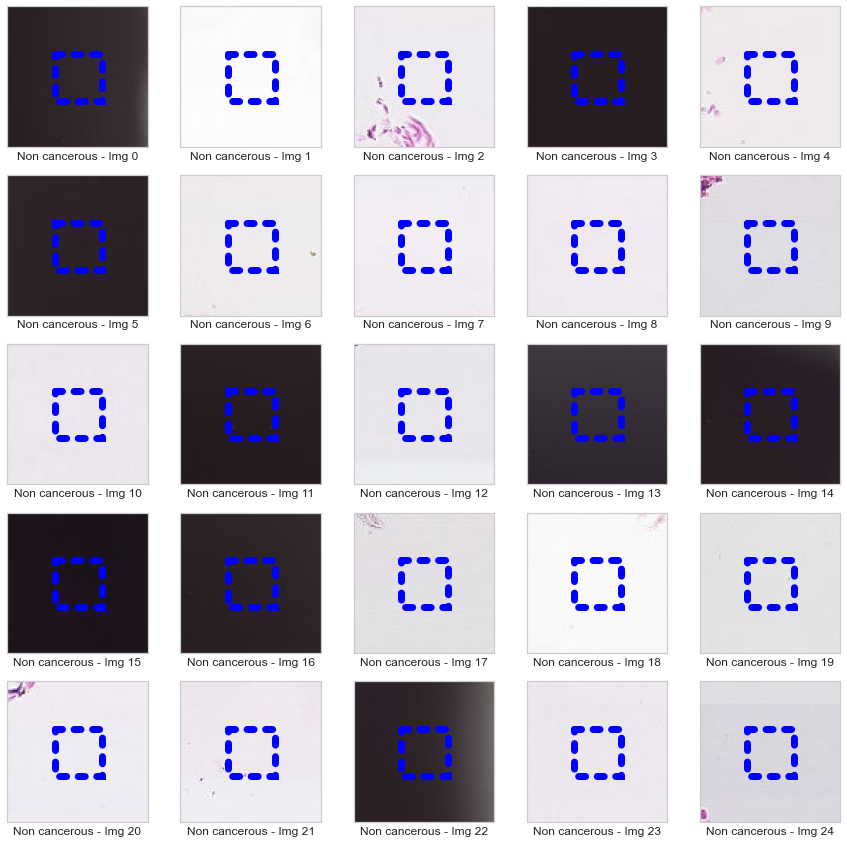

In [75]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_low_contrast = low_contrast_pd[low_contrast_pd["low_noise"] == True][low_contrast_pd['is_low_contrast'] == True]

for i, current_subplot in zip(range(len(shuffled_low_contrast)), ax.flat):
    try:
        current_row = shuffled_low_contrast.iloc[i]

        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
    
        current_subplot.imshow(current_row['image'])

        curr_label = 'Non cancerous'
        edgecolor='blue'
        
        if current_row['is_cancer']:
            curr_label = 'Cancerous'
            edgecolor='red'

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=edgecolor, facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box) 
    except IndexError as e:
        None
plt.show()

The images above were found as being with low noise and low contrast. As we've previously assume these look like the result of bad microscope scan, they are homogenous in color and have almost no tissue at all.

Boolean Series key will be reindexed to match DataFrame index.


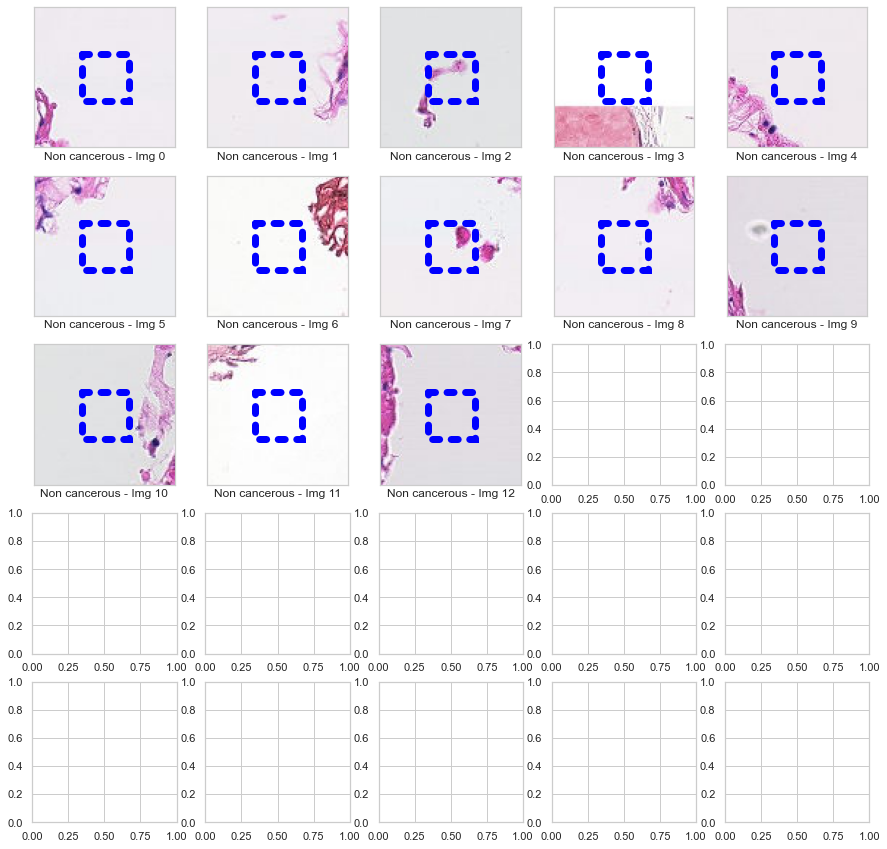

In [76]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_low_contrast = low_contrast_pd[low_contrast_pd["low_noise"] == True][low_contrast_pd['is_low_contrast'] == False]

for i, current_subplot in zip(range(len(shuffled_low_contrast)), ax.flat):
    try:
        current_row = shuffled_low_contrast.iloc[i]

        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
    
        current_subplot.imshow(current_row['image'])

        curr_label = 'Non cancerous'
        edgecolor='blue'
        
        if current_row['is_cancer']:
            curr_label = 'Cancerous'
            edgecolor='red'

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=edgecolor, facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box) 
    except IndexError as e:
        None
plt.show()

The images presented above have low noise but don't have low contrast. As we've assumed we see elements like partial scans or partial tissue. 

Boolean Series key will be reindexed to match DataFrame index.


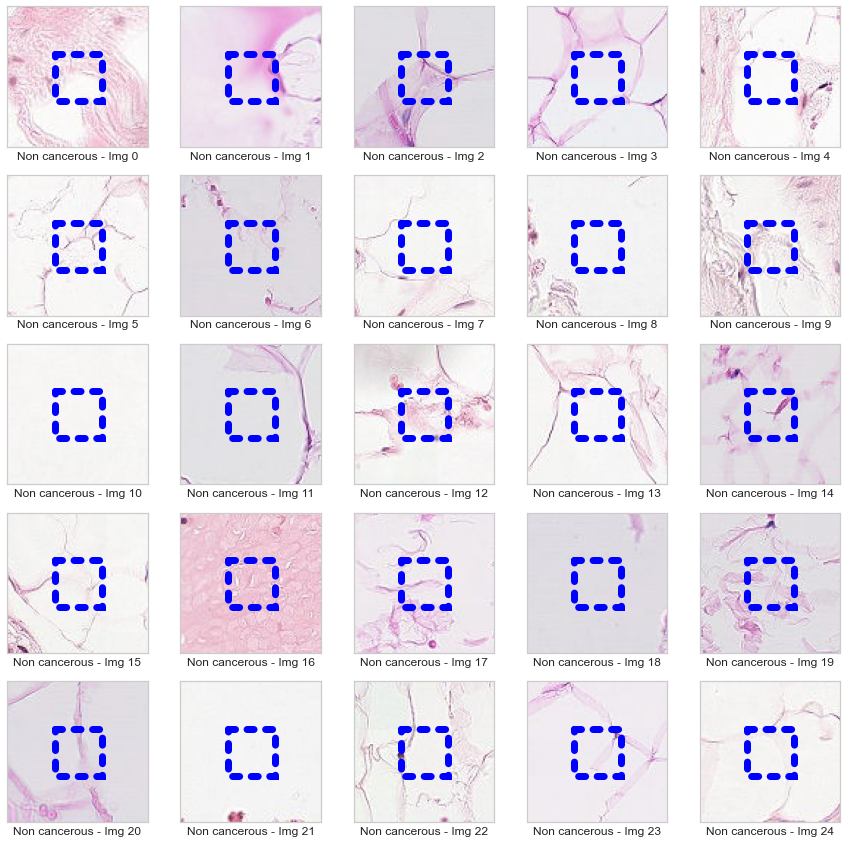

In [77]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_low_contrast = low_contrast_pd[low_contrast_pd["low_noise"] == False][low_contrast_pd['is_low_contrast'] == True]

for i, current_subplot in zip(range(len(shuffled_low_contrast)), ax.flat):
    try:
        current_row = shuffled_low_contrast.iloc[i]

        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
    
        current_subplot.imshow(current_row['image'])

        curr_label = 'Non cancerous'
        edgecolor='blue'
        
        if current_row['is_cancer']:
            curr_label = 'Cancerous'
            edgecolor='red'

        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=edgecolor, facecolor='none', linestyle=':', capstyle='round')
        
        current_subplot.xaxis.label.set_text(f"{curr_label} - Img {i}")
        current_subplot.add_patch(box) 
    except IndexError as e:
        None
plt.show()

The images reflected above are low on contrast but not low on noise. As we've assumed they are mostly blurry, for example img 1, or have some tissue from the edge of the scan, for example img 15, 21, 10. 

Overall the images that are low on contrast, low on noise or both are faulty images. This is not a novel approach, the blank regions of the WSI are removed beforehand by a threshold on the intensity, for these regions are less informative for diagnosis. More over, the curators of this dataset did extensive work as well do detect faulty images, specifically background patches. To prevent selecting background patches, slides were converted to HSV, blurred, and patches filtered out if maximum pixel saturation lies below 0.07 (which was validated to not throw out tumor data in the training set). Non the less there is no denying we still found some fauly, and background patches, containing no tissue.

Now that we detected them we're gonna filter them out.

In [2310]:
cleaned_data = pd.DataFrame(data=low_contrast_pd[low_contrast_pd["low_noise"] == False][low_contrast_pd['is_low_contrast'] == False])

Boolean Series key will be reindexed to match DataFrame index.


In [2311]:
cleaned_data.drop(columns=["is_low_contrast","low_noise"],inplace=True)

## Feature extraction

In the intro to this project we've mentioned and discussed that in the process of performing a diagnostics the pathologist assess the tissue using four main factors 
* tissue morphology, reflects in description of the shape, structure, form, and size of cells.
* cell size
* cell distribution 
* color 

We are going to attempt to extract features that will reflect these factors. For this reason we've decided to extract three types of features
* Color features - calculated from the histograms of the different color channnels of the images. This will help us with the purpose of color assesing and, since the cells are stained, with cell distribution.
* Texture features - these will help us with the process of tissue morphology and size
* Deep features - these will be extracted using a a pretrained convolutional neural network in a process of transfer learning using VGG19. These will also help us with the process of tissue morphology and size

Before performing feature extraction we're going to perform the train-test split, since performing it afterwards can potentially cause information likeage which in turn cause overfitting.

### Balance and train-test split

In [2312]:
from sklearn.model_selection import train_test_split

In [2313]:
cleaned_data.loc[cleaned_data.is_cancer == True, 'is_cancer'] = 'cancerous'
cleaned_data.loc[cleaned_data.is_cancer == False, 'is_cancer'] = 'normal'

<AxesSubplot:xlabel='is_cancer', ylabel='count'>

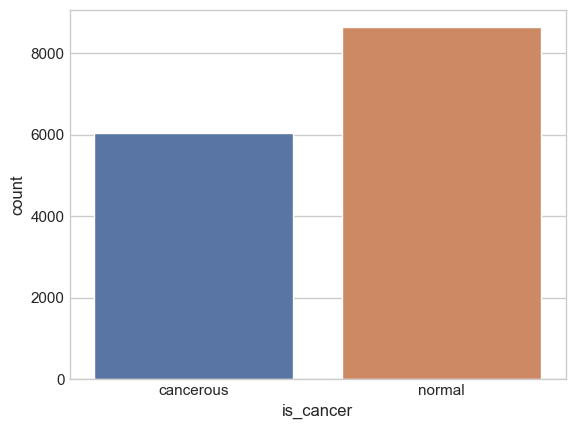

In [2314]:
sns.countplot(data=cleaned_data, x='is_cancer')

As we've seen before our data is slightly unbalanced between the classification labels. Since it's easier working with balanced datasets, we're going to undersample the normal class.

In [2315]:
cleaned_data_cancer = cleaned_data[cleaned_data.is_cancer == 'cancerous']
cleaned_data_normal = cleaned_data[cleaned_data.is_cancer != 'cancerous']

cleaned_data_undersampled_normal = cleaned_data_normal.sample(len(cleaned_data_cancer), random_state=42)

X = shuffle(pd.concat([cleaned_data_undersampled_normal, cleaned_data_cancer]), random_state=42)

<AxesSubplot:xlabel='is_cancer', ylabel='count'>

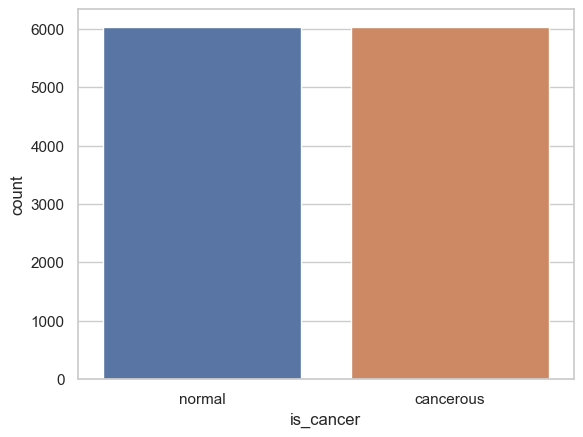

In [1280]:
sns.countplot(data=X, x='is_cancer')

The bar plot above shows that the classes are now equal in number.

In [2316]:
y = X['is_cancer'].copy()
X.drop(columns=['is_cancer'], inplace=True)

In [2317]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)

### Stain color normalization

As already mentioned, the tissue slices are stained by H&E to differentiate between nuclei stained with purple color as well as other tissue structures stained with pink and red color to help pathologists analyze the shape of nuclei, density, variability and overall tissue structure. H&E staining variability between images exists due to the different staining protocols, scanners and raw materials. Stainnormalization of
H&E stained histology slides is a necessary step to reduce the color variation and obtain a better color before using ML models on the data.

Different approaches have been proposed for stain normalization in histological images, we've attempted to use the one by Zheng et al., (2019) due to the fact that the code base is accessible and we could modify and update it easy to different version of python and TensorFlow.

In [1583]:
# initial varphi for rgb input
init_varphi = np.asarray([[0.294, 0.110, 0.894],
                          [0.750, 0.088, 0.425]])

# # initial varphi for bgr input
# init_varphi = np.asarray([[0.6060, 1.2680, 0.7989],
#                           [1.2383, 1.2540, 0.3927]])

def acd_model(input_od, lambda_p=0.002, lambda_b=10, lambda_e=1, eta=0.6, gamma=0.5):
    """
    Stain matrix estimation by
    "Yushan Zheng, et al., Adaptive Color Deconvolution for Histological WSI Normalization."
    """
    alpha = tf.Variable(init_varphi[0], dtype='float32')
    beta = tf.Variable(init_varphi[1], dtype='float32')
    w = [tf.Variable(1.0, dtype='float32'), tf.Variable(1.0, dtype='float32'), tf.constant(1.0)]

    sca_mat = tf.stack((tf.cos(alpha) * tf.sin(beta), tf.cos(alpha) * tf.cos(beta), tf.sin(alpha)), axis=1)
    cd_mat = tf.linalg.inv(sca_mat)
    
    s = tf.matmul(input_od, cd_mat) * w
    h, e, b = tf.split(s, (1, 1, 1), axis=1)

    l_p1 = tf.reduce_mean(tf.square(b))
    l_p2 = tf.reduce_mean(2 * h * e / (tf.square(h) + tf.square(e)))
    l_b = tf.square((1 - eta) * tf.reduce_mean(h) - eta * tf.reduce_mean(e))
    l_e = tf.square(gamma - tf.reduce_mean(s))

    objective = l_p1 + lambda_p * l_p2 + lambda_b * l_b + lambda_e * l_e

    target =  tf.compat.v1.train.AdagradOptimizer(learning_rate=0.05).minimize(objective)

    return target, cd_mat, w

In [1584]:
class StainNormalizer(object):
    def __init__(self, pixel_number=100000, step=300, batch_size=1500):
        self._pn = pixel_number
        self._bs = batch_size
        self._step_per_epoch = int(pixel_number / batch_size)
        self._epoch = int(step / self._step_per_epoch)
        self._template_dc_mat = None
        self._template_w_mat = None

    def fit(self, images):
        opt_cd_mat, opt_w_mat = self.extract_adaptive_cd_params(images)
        self._template_dc_mat = opt_cd_mat
        self._template_w_mat = opt_w_mat

    def transform(self, images):
        if self._template_dc_mat is None:
            raise AssertionError('Run fit function first')

        opt_cd_mat, opt_w_mat = self.extract_adaptive_cd_params(images)
        transform_mat = np.matmul(opt_cd_mat * opt_w_mat,
                                  np.linalg.inv(self._template_dc_mat * self._template_w_mat))

        od = -np.log((np.asarray(images, float) + 1) / 256.0)
        normed_od = np.matmul(od, transform_mat)
        normed_images = np.exp(-normed_od) * 256 - 1

        return np.maximum(np.minimum(normed_images, 255), 0)

    def he_decomposition(self, images, od_output=True):
        if self._template_dc_mat is None:
            raise AssertionError('Run fit function first')

        opt_cd_mat, _ = self.extract_adaptive_cd_params(images)

        od = -np.log((np.asarray(images, float) + 1) / 256.0)
        normed_od = np.matmul(od, opt_cd_mat)

        if od_output:
            return normed_od
        else:
            normed_images = np.exp(-normed_od) * 256 - 1
            return np.maximum(np.minimum(normed_images, 255), 0)


    def sampling_data(self, images):
        pixels = np.reshape(images, (-1, 3))
        pixels = pixels[np.random.choice(pixels.shape[0], min(self._pn * 20, pixels.shape[0]))]
        od = -np.log((np.asarray(pixels, float) + 1) / 256.0)
        
        # filter the background pixels (white or black)
        tmp = np.mean(od, axis=1)
        od = od[(tmp > 0.3) & (tmp < -np.log(30 / 256))]
        od = od[np.random.choice(od.shape[0], min(self._pn, od.shape[0]))]

        return od

    def extract_adaptive_cd_params(self, images):
        """
        :param images: RGB uint8 format in shape of [k, m, n, 3], where
                       k is the number of ROIs sampled from a WSI, [m, n] is 
                       the size of ROI.
        """
        od_data = self.sampling_data(images)
        input_od = tf.compat.v1.placeholder(dtype=tf.float32, shape=[None, 3])
        target, cd, w = acd_model(input_od)
        init = tf.compat.v1.global_variables_initializer()

        with tf.compat.v1.Session() as sess:
            sess.run(init)
            for ep in range(self._epoch):
                for step in range(self._step_per_epoch):
                    sess.run(target, {input_od: od_data[step * self._bs:(step + 1) * self._bs]})
            opt_cd = sess.run(cd)
            opt_w = sess.run(w)
        return opt_cd, opt_w

In [1440]:
import os
# disable GPU
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

result_dir = './data/normalized_images'

In [1485]:
normalizer = StainNormalizer()

In [1581]:
tf.compat.v1.disable_eager_execution()

In [2325]:
X_train['image'] = X_train['image'].values/256

In [2326]:
X_test['image'] = X_test['image'].values/256

In [1585]:
normalizer.fit(np.stack(X_train['image']))

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [1587]:
X_train['normalized_image'] = list(normalizer.transform(np.stack(X_train['image'])))
X_test['normalized_image'] = list(normalizer.transform(np.stack(X_test['image'])))

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


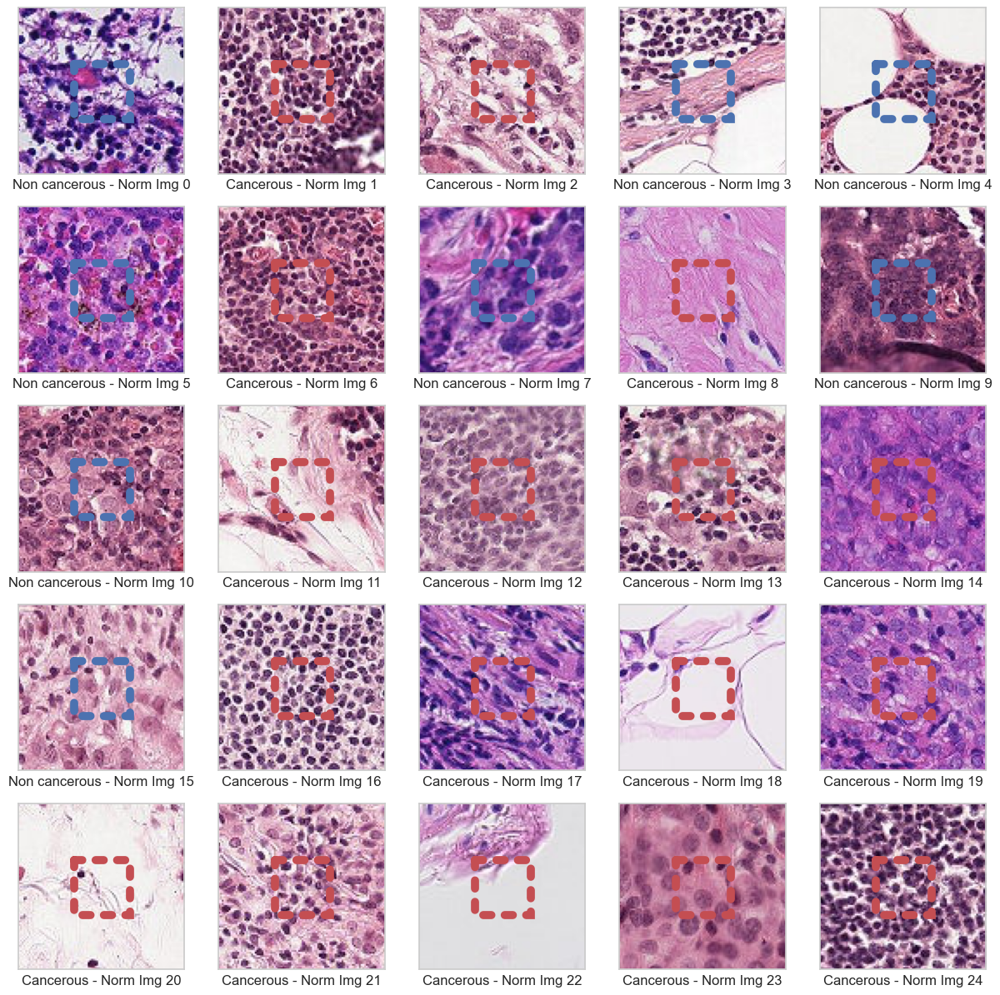

In [1990]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_data = shuffle(X_train, random_state=44)

for (i,current_subplot) in zip(range(25),ax.flat):
    current_row = shuffled_data
    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        # read image and add to plot
        current_subplot.imshow(current_row['normalized_image'].iloc[i])
        
        current_label = y_train.iloc[i+1]
        
        if (current_label == 'cancerous'):
            current_patch_color = 'r'
            curr_label = 'Cancerous'
        else:
            current_patch_color = 'b'
            curr_label = 'Non cancerous'
        
        # create patch recatangle around the suspected area
        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=current_patch_color, facecolor='none', linestyle=':', capstyle='round')
        
        # add labels and patch 
        current_subplot.xaxis.label.set_text(f"{curr_label} - Norm Img {i}")
        current_subplot.add_patch(box)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()


The images above are images produced by adaptive Color deconvolution for Histological WSI Normalization. They look the same to our untrained naked eye. Lets try some image math, subtract the images one from another.

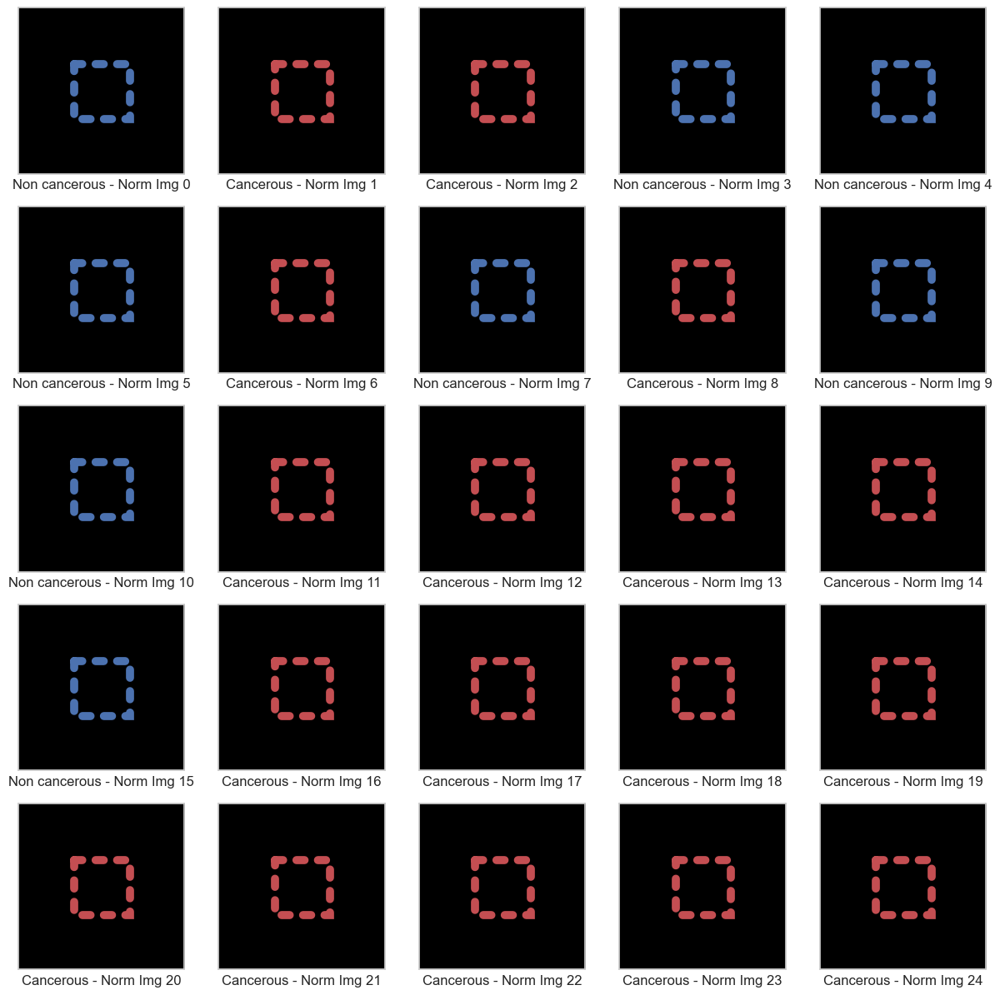

In [2004]:
fig, ax = plt.subplots(5, 5, figsize=(15,15))

shuffled_data = shuffle(X_train, random_state=44)

for (i,current_subplot) in zip(range(25),ax.flat):
    current_row = shuffled_data
    
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    try:
        # read image and add to plot
        current_subplot.imshow(np.absolute(shuffled_data['image'].iloc[i] - shuffled_data['normalized_image'].iloc[i]))
        
        current_label = y_train.iloc[i+1]
        
        if (current_label == 'cancerous'):
            current_patch_color = 'r'
            curr_label = 'Cancerous'
        else:
            current_patch_color = 'b'
            curr_label = 'Non cancerous'
        
        # create patch recatangle around the suspected area
        box = patches.Rectangle((32,32),32,32, linewidth=7, edgecolor=current_patch_color, facecolor='none', linestyle=':', capstyle='round')

        # add labels and patch 
        current_subplot.xaxis.label.set_text(f"{curr_label} - Norm Img {i}")
        current_subplot.add_patch(box)
    except Exception as e:
        logger.error("A problem happened while trying to represent the image", e)
    
plt.show()

The images above represent the absolute difference between the original and the normalized image. The values of the difference are close to 0, and so plotting these images produces a black frame.

Because of the way we're working with images later on with Keras we have to save the representation of these images to a folder on disc. And that's what we're going to do in the next several frames.

In [2005]:
norm_train_path = "../../data/histopathologic-cancer-detection/normalized_data/train/"
norm_test_path = "../../data/histopathologic-cancer-detection/normalized_data/test/"

In [2012]:
import shutil
shutil.rmtree(norm_train_path)
shutil.rmtree(norm_test_path)

In [2013]:
os.makedirs(norm_train_path) 
os.makedirs(norm_test_path) 

In [2014]:
def saved_norm_image(img_id, img, path):
    path_to_file = f'{path}{img_id}.png'
    cv.imwrite(path_to_file, cv.cvtColor(np.float32(img)*255., cv.COLOR_BGR2RGB))
    
    return path_to_file

In [2016]:
X_train["normalized_file"] = X_train.apply(lambda row: saved_norm_image(row["id"], row["image"], norm_train_path), axis=1)

In [2015]:
X_test["normalized_file"] = X_test.apply(lambda row: saved_norm_image(row["id"], row["image"], norm_test_path), axis=1)

This normalization process did not contribute to any of our models so we've decided to drop at this point.

### Color feature extraction

As we've previously seen, different channel intesities differ for cancerous and non cancerous images. This difference might contribute to our future model, for this reason we've decided to to extract features based on the different color channels. We'll start of by splitting each image to three color channels.

In [2327]:
def split_channels(image):
    return [image[:,:,0], image[:,:,1], image[:,:,2]]

In [2328]:
color_channels_train = X_train.apply(lambda row: split_channels(row['image']), result_type='expand', axis=1)
color_channels_test = X_test.apply(lambda row: split_channels(row['image']), result_type='expand', axis=1)

In [2329]:
color_channels_train.columns = ['red', 'green', 'blue']
color_channels_test.columns = ['red', 'green', 'blue']

After splitting the images to thd different channels, let's calculate their histograms. This will allow us to calculate and extract different statistical features. 

For the image

cancerous


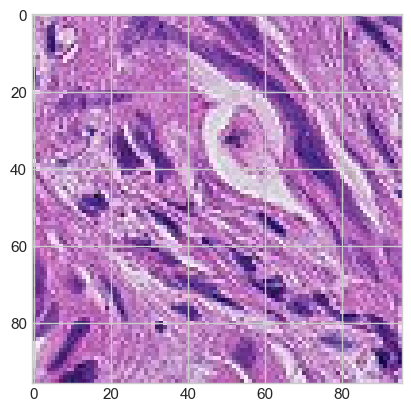

In [2330]:
plt.imshow(X_train.iloc[22]['image'])
print(y_train.iloc[22])

This is a cancerous tissue image. Lets look at it's histogram before calculating all of them

In [2331]:
red_histogram, red_bin_edges = np.histogram(color_channels_train.iloc[22]['red'], bins=256, range=(0, 1))
green_histogram, green_bin_edges = np.histogram(color_channels_train.iloc[22]['green'], bins=256, range=(0, 1))
blue_histogram, blue_bin_edges = np.histogram(color_channels_train.iloc[22]['blue'], bins=256, range=(0, 1))

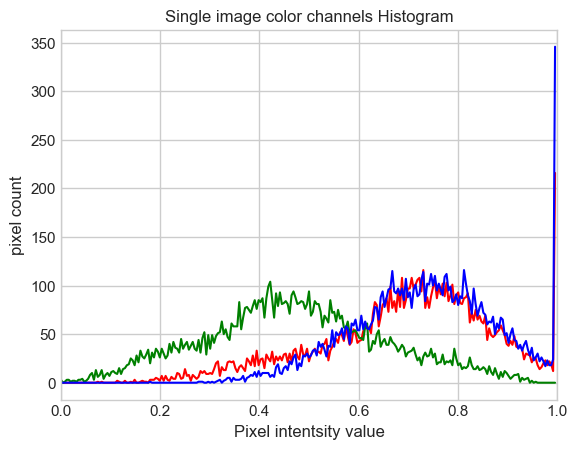

In [2332]:
plt.figure()

plt.title("Single image color channels Histogram")
plt.xlabel("Pixel intentsity value")
plt.ylabel("pixel count")
plt.xlim([0.0, 1.0])  

plt.plot(red_bin_edges[0:-1], red_histogram, color='red')
plt.plot(green_bin_edges[0:-1], green_histogram, color='green')
plt.plot(blue_bin_edges[0:-1], blue_histogram, color='blue')

plt.show()

This is similar to what we've seen before. The green pixels in the image are less intense than the red and blue one. Lets calculate the histograms.

In [2333]:
def get_histogram(red_channel, green_channel, blue_channel):
    histogram1, big_edges1 = np.histogram(red_channel/256, bins=256, range=(0, 1))
    histogram2, big_edges2 = np.histogram(green_channel/256, bins=256, range=(0, 1))
    histogram3, big_edges3 = np.histogram(blue_channel/256, bins=256, range=(0, 1))

    return [histogram1, big_edges1, histogram2, big_edges2, histogram3, big_edges3]

In [2334]:
color_channels_train_hists = color_channels_train.apply(lambda row: get_histogram(row['red'], row['green'], row['blue']), result_type='expand', axis=1)
color_channels_test_hists = color_channels_test.apply(lambda row: get_histogram(row['red'], row['green'], row['blue']), result_type='expand', axis=1)

In [2335]:
color_channels_train_hists.columns = ['red_hist','red_bins','green_hist','green_bins','blue_hist','blue_bins']
color_channels_test_hists.columns = ['red_hist','red_bins','green_hist','green_bins','blue_hist','blue_bins']

Now that we have our histogram, lets calculate some metrics and extract them. The features we are going to calculate are:
* mean
* variance
* standart deviation 
* skewness
* kurtosis

This is similar to what was done in a study on multi feature classification of cancer observed in histological sections by Bhattacharjee et al., (2019). 


In [2336]:
from scipy.stats import kurtosis
from scipy.stats import skew

def mean_h(val, freq):
    return np.average(val, weights = freq)

def var_h(val, freq):
    dev = freq * (val - mean_h(val, freq)) ** 2
    return dev.sum() / freq.sum()

def std_h(val, freq):
    return np.sqrt(var_h(val, freq))

def skew_h(val, freq):
    return skew(np.repeat(val, freq))

def kurtosis_h(val, freq):
    return kurtosis(np.repeat(val, freq))


In [2337]:
def calculate_channel_metrics(red_hist, red_bins, blue_hist, blue_bins, green_hist, green_bins):    
    return [mean_h(red_bins[0:-1], red_hist), mean_h(green_bins[0:-1], green_hist), mean_h(blue_bins[0:-1], blue_hist), 
     var_h(red_bins[0:-1], red_hist), var_h(green_bins[0:-1], green_hist), var_h(blue_bins[0:-1], blue_hist), 
     std_h(red_bins[0:-1], red_hist), std_h(green_bins[0:-1], green_hist), std_h(blue_bins[0:-1], blue_hist),
     skew_h(red_bins[0:-1], red_hist), skew_h(green_bins[0:-1], green_hist), skew_h(blue_bins[0:-1], blue_hist), 
     kurtosis_h(red_bins[0:-1], red_hist), kurtosis_h(green_bins[0:-1], green_hist), kurtosis_h(blue_bins[0:-1], blue_hist)]

In [2338]:
color_channels_features_train = color_channels_train_hists.apply(lambda row: calculate_channel_metrics(row['red_hist'], row['red_bins'],
                                                                            row['green_hist'], row['green_bins'], 
                                                                            row['blue_hist'], row['blue_bins']), result_type='expand', axis=1)

In [2339]:
color_channels_features_test = color_channels_test_hists.apply(lambda row: calculate_channel_metrics(row['red_hist'], row['red_bins'],
                                                                            row['green_hist'], row['green_bins'], 
                                                                            row['blue_hist'], row['blue_bins']), result_type='expand', axis=1)

In [2340]:
stats = ['mean','var','std','skewness','kurtosis']
color_channels_cols = color_channels_train.columns.values

In [2341]:
color_channels_features_cols = []

for stat in stats:
    for color_channel in color_channels_cols:
        color_channels_features_cols.append(f'{color_channel}_{stat}')

In [2342]:
color_channels_features_train.columns  = color_channels_features_cols
color_channels_features_test.columns  = color_channels_features_cols

In [2343]:
color_channels_features_train

,red_mean,green_mean,blue_mean,red_var,green_var,blue_var,red_std,green_std,blue_std,red_skewness,green_skewness,blue_skewness,red_kurtosis,green_kurtosis,blue_kurtosis
106161,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
185943,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
163146,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
120039,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
191994,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143831,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
178844,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
60779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0
202140,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-3.0,-3.0


The above table represents the features extracted from each color channel for each image.

### Texture feature extraction

* ### Histogram of oriented gradients (HOG)

In [1301]:
from skimage.feature import hog as hog_feature
from skimage import exposure

Lets take a look at the histogram of oriented gradients for the two random cancerous and non cancerous images. 

For the HOG feature descriptor, the most common image size is 64×128 (width x height) pixels. From what we read online the original paper by Dalal and Triggs mainly focused on human recognition and detection, althout HOG is used over and over againn in the analysis and classification of histopathological images. Galal and Triggs found that 64×128 is the ideal image size, but any 1:2 size we'll work.

In addition, the classification label is decided upon the existance of cancerous cells in the 36x36 crop of the center of the image. But cropping the image gave us constantly worst performance then just resizing it, so we've decided to not crop it after all. See discussion about different experiments at the summary.

In [2344]:
fd_positive, hog_positive_image = hog_feature(random_positive_image, feature_vector=True, orientations=12, 
                    pixels_per_cell=(6, 6), cells_per_block=(3, 3), 
                    block_norm='L2-Hys', visualize=True, transform_sqrt=True, channel_axis=2)
fd_negative, hog_negative_image = hog_feature(single_negative_image, feature_vector=True, orientations=12, 
                    pixels_per_cell=(6, 6), cells_per_block=(3, 3), 
                    block_norm='L2-Hys', visualize=True, transform_sqrt=True, channel_axis=2)

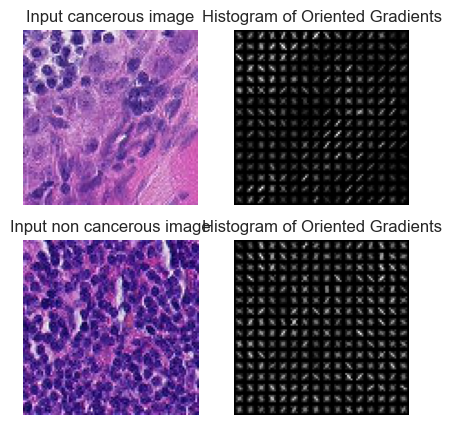

In [2345]:
fig, ax = plt.subplots(2, 2, figsize=(5, 5), sharex=True, sharey=True)

ax[0,0].axis('off')
ax[0,0].imshow(random_positive_image, cmap=plt.cm.gray)
ax[0,0].set_title('Input cancerous image')

ax[1,0].axis('off')
ax[1,0].imshow(single_negative_image, cmap=plt.cm.gray)
ax[1,0].set_title('Input non cancerous image')

# Rescale histogram for better display
hog_image_positive_rescaled = exposure.rescale_intensity(hog_positive_image, in_range=(0, 10))
hog_image_negative_rescaled = exposure.rescale_intensity(hog_negative_image, in_range=(0, 10))

ax[0,1].axis('off')
ax[0,1].imshow(hog_image_positive_rescaled, cmap=plt.cm.gray)
ax[0,1].set_title('Histogram of Oriented Gradients')

ax[1,1].axis('off')
ax[1,1].imshow(hog_image_negative_rescaled, cmap=plt.cm.gray)
ax[1,1].set_title('Histogram of Oriented Gradients')

plt.show()

It's interesting to look at the histogram of oriented gradients image. For both images we can see that the gradients are darker and without a clear direction on the white spots that do not have any angle changes in them. For the cancerous image, see how on the clearer surface the gradient are also almost unnoticable.

In [2346]:
len(fd_positive)

21168

As seen above we have received a feature vector of the oriented gradients for each image with 21168 features. Lets now extract the hog for all the images.

In [2347]:
def get_hog_image(image):
    return hog_feature(image, feature_vector=True, orientations=12, 
                       pixels_per_cell=(6, 6), cells_per_block=(3, 3), block_norm='L2-Hys', 
                       visualize=False, transform_sqrt=True, channel_axis=2)

In [2348]:
hog_features_train = X_train.apply(lambda row: get_hog_image(row['image']), axis=1)
hog_features_test = X_test.apply(lambda row: get_hog_image(row['image']), axis=1)

* ### Local binary pattern (LBP)

Alhindi et al. (2018) achieved the highest results with features extracted by LBP compared to HOG and ANN, for the task of classification of histopathology images. Wang (2009) has combined LBP with HOG descriptor to improve detection performance. The combined use of HOG and LBP for the classification of histopathology images appears in the literature a few more times, Cai et al. (2022) extracted three statistical features; HOG, LBP and Gray-Level Co-Occurrence Matrix (GLCM) singularity testing each one with deep features extracted from Alex-Net trained on ImageNet images.

In [3322]:
from skimage.transform import rotate
from skimage.feature import local_binary_pattern
from skimage.color import label2rgb

radius = 1
n_points = 8 * radius

METHOD = 'uniform'

plt.rcParams['font.size'] = 9

In [3325]:
random_image = X_train.sample(1, random_state=24).iloc[0]['image'].astype('float32')

LBP works with gray scale images, so first thing is convert the original image to gray scale.

In [3326]:
gray_random_image = cv.cvtColor(random_image, cv.COLOR_RGB2GRAY)

In [3327]:
lbp_random_image = local_binary_pattern(gray_random_image, n_points, radius, METHOD)       

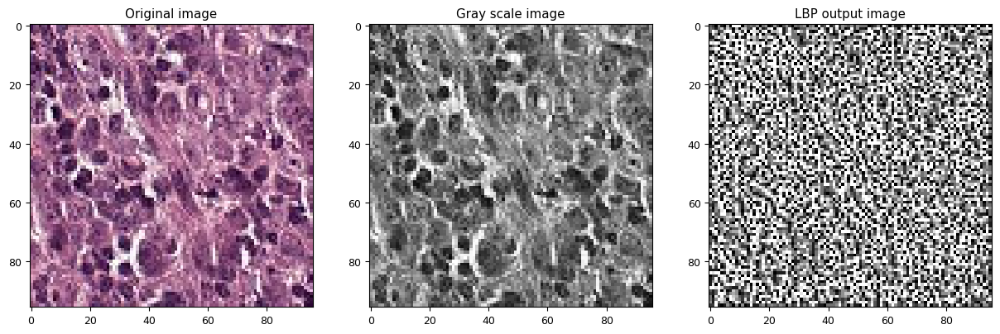

In [3328]:
fig, ax = plt.subplots(1, 3, figsize=(15, 15))

ax[0].set_title('Original image')
ax[0].imshow(random_image)

ax[1].set_title('Gray scale image')
ax[1].imshow(gray_random_image)

ax[2].set_title('LBP output image')
ax[2].imshow(lbp_random_image, )

plt.show()

The above three images show the evolution through the LBP processing. The first image is our original RGB image, second image is the gray scale image and the third one represents our LBP image. It doesn't look like the LBP output image is representing the texture of the original image too loyaly.

In [3329]:
(lbp_hist, _) = np.histogram(lbp_random_image.ravel(), bins = np.arange(0, n_points + 3), range=(0, n_points + 2))

# normalize the histogram
lbp_hist = lbp_hist.astype("float")

# Avoid devision by 0
lbp_hist /= (lbp_hist.sum() + 1e-7)

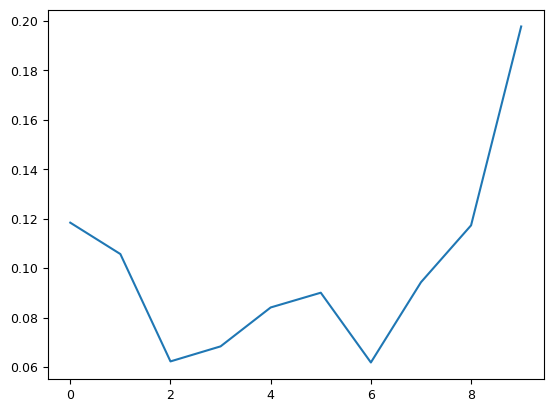

In [3330]:
plt.plot(lbp_hist)

The above plot represents the LBP histogram for the above observed image.

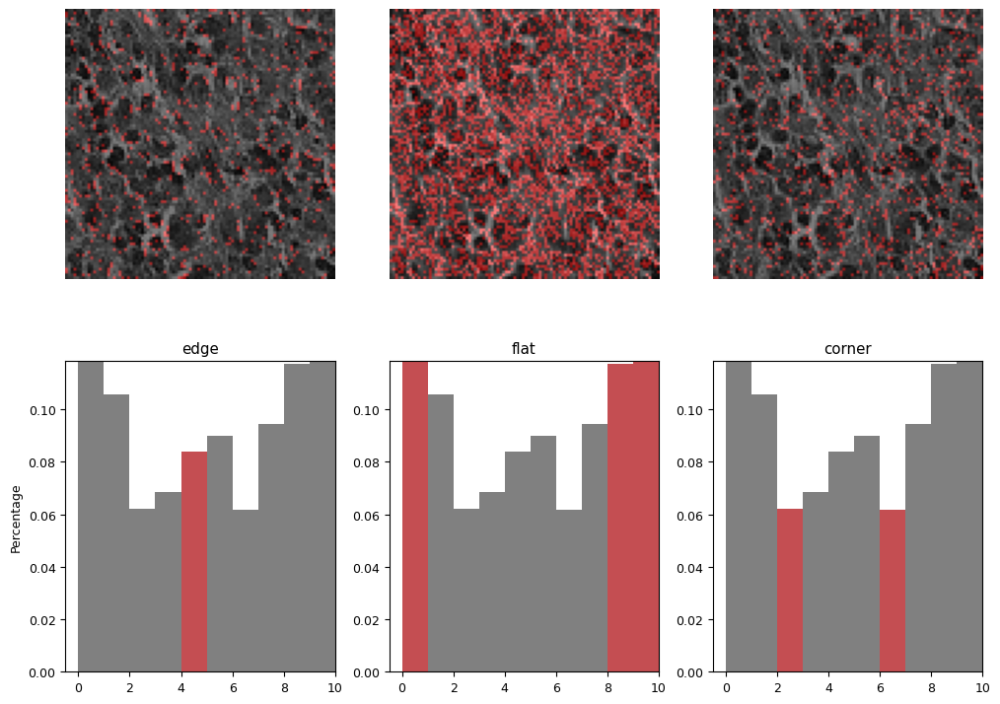

In [3331]:
def overlay_labels(image, lbp, labels):
    mask = np.logical_or.reduce([lbp == each for each in labels])
    return label2rgb(mask, image=image, bg_label=0, alpha=0.5)


def highlight_bars(bars, indexes):
    for i in indexes:
        bars[i].set_facecolor('r')


image = gray_random_image
lbp = local_binary_pattern(image, n_points, radius, METHOD)


def hist(ax, lbp):
    n_bins = int(lbp.max() + 1)
    return ax.hist(lbp.ravel(), density=True, bins=n_bins, range=(0, n_bins),
                   facecolor='0.5')


# plot histograms of LBP of textures
fig, (ax_img, ax_hist) = plt.subplots(nrows=2, ncols=3, figsize=(12, 9))
plt.gray()

titles = ('edge', 'flat', 'corner')

w = width = radius - 1
edge_labels = range(n_points // 2 - w, n_points // 2 + w + 1)
flat_labels = list(range(0, w + 1)) + list(range(n_points - w, n_points + 2))
i_14 = n_points // 4            # 1/4th of the histogram
i_34 = 3 * (n_points // 4)      # 3/4th of the histogram
corner_labels = (list(range(i_14 - w, i_14 + w + 1)) +
                 list(range(i_34 - w, i_34 + w + 1)))

label_sets = (edge_labels, flat_labels, corner_labels)

for ax, labels in zip(ax_img, label_sets):
    ax.imshow(overlay_labels(image, lbp, labels))

for ax, labels, name in zip(ax_hist, label_sets, titles):
    counts, _, bars = hist(ax, lbp)
    highlight_bars(bars, labels)
    ax.set_ylim(top=np.max(counts[:-1]))
    ax.set_xlim(right=n_points + 2)
    ax.set_title(name)

ax_hist[0].set_ylabel('Percentage')

for ax in ax_img:
    ax.axis('off')

In the upper row we can see the different highlights in red for flat, edge and corner regions of the selected random image as identified by the LBP algorithem. The lower graph presents the LBP histogram, with the highlighted regions that show the percentage of each texture in the histogram.

In [3332]:
def get_lbp_hist(image):
    gray_image = cv.cvtColor(image.astype('float32'), cv.COLOR_BGR2GRAY)
    lbp_image = local_binary_pattern(gray_image, n_points, radius, METHOD) 
    
    (lbp_hist, _) = np.histogram(lbp_image.ravel(), bins = np.arange(0, n_points + 3), range=(0, n_points + 2))
    
    # normalize the histogram
    lbp_hist = lbp_hist.astype("float")

    # Avoid devision by 0
    lbp_hist /= (lbp_hist.sum() + 1e-7)
    
    return lbp_hist

In [3333]:
lbp_features_train = X_train['image'].apply(get_lbp_hist)

In [3334]:
lbp_features_test = X_test['image'].apply(get_lbp_hist)

### Deep feature extraction

For the deep learning method we at first wanted to utilize ResNet50 which has been trained on the ImageNet dataset for identifying different images to extract the deep features out of our images. We've seen ResNet50 used for image classification, specifically for histopathological classifications of breast cancer (Al-Haija & Adebanjo, 2020; Behar & Shrivastava, 2021). Al-Haija and Adebanjo achieved an accuracy of 99% using transfer learning utilizing RedNet50! They used the [BreakHis](https://web.inf.ufpr.br/vri/databases/breast-cancer-histopathological-database-breakhis/) histopathological imagery dataset of breast cancer, that is composed to 9109 images. No ROC metric was provided for their  model, but nonetheless it's a very impressive accuracy number. For these reasons we've decided to use RedNet50 at this stage. Extracting features for 96x96 images from ResNet50 turned out to be a big problem with tens of thousand of output feature and the need to rescale our images to over 200x200. 

We've realised we need to find a good CNN for feature extraction of relativly small images, which are the ones we have at hand, 96x96. VGG19 was also used to histological image analysis and classification and showed relativly good results (Kassani, Kassani, Wesolowski, Schneider & Deters, 2019).

In [1900]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [1880]:
vgg_19_base_model = VGG19(weights="imagenet", include_top=False, input_shape=(96,96,3))

In [1882]:
vgg_19_base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 96, 96, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 96, 96, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 96, 96, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 48, 48, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 48, 48, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 48, 48, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 24, 24, 128)       0     

The printout below is of VGG19 without the top layer, this model will be used for deep feature extraction. The final feature vector will be of 3x3x512, 4608 featurs. We will not be useing a flattening layer at this point, this will allow us to take a look at the extracted features.

In [1962]:
datagen = ImageDataGenerator(horizontal_flip=True,
                             vertical_flip=True,
                             zoom_range=0.2,
                             shear_range=0.2,
                             rotation_range=90,
                             fill_mode='nearest',
                             preprocessing_function=preprocess_input) 

To avoid overfitting that could potentially lead to low detection rate the following data augmentation parameters are used above
* horizontal flip
* vertical flip
* zoom range
* shear range
* rotational range
* fill mode nearest

These augmentation technique is similar to the one used by Kassani et al. (2019) when dealing with histological images for classification using neural net ansamble. The data generator is then fit on the train data to be able to compute quantities required for featurewise  normalization like zca whiteninng. But after doing that we realised we didn't have any performance gain, so decided to drop this configuration.



In [2019]:
train = pd.concat([X_train,y_train], axis=1)
test = pd.concat([X_test,y_test], axis=1)

In [1964]:
batch_size = 32

train_set = datagen.flow_from_dataframe(train,
                                        x_col='file_name',
                                        y_col='is_cancer',
                                        target_size=(96,96),
                                        batch_size=batch_size,
                                        class_mode='binary',
                                        shuffle=True)

val_set = datagen.flow_from_dataframe(test,
                                        x_col='file_name',
                                        y_col='is_cancer',
                                        target_size=(96,96),
                                        batch_size=batch_size,
                                        class_mode='binary',
                                        shuffle=True)

Found 8442 validated image filenames belonging to 2 classes.
Found 3618 validated image filenames belonging to 2 classes.


In [2023]:
deep_features_train = vgg_19_base_model.predict(train_set_norm)

In [2024]:
deep_features_test = vgg_19_base_model.predict(val_set_norm)

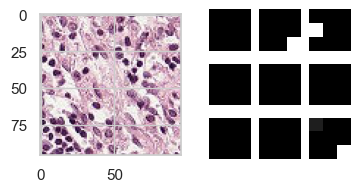

In [1967]:
from matplotlib import gridspec

n_features = deep_features_train[42].shape[-1]

fig = plt.figure(figsize = (4, 2))
gs = gridspec.GridSpec(1, 2, figure = fig)
sub_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=gs[1])

ax1 = fig.add_subplot(gs[0])
ax1.imshow(X_train['image'].iloc[42])

for i in range(3):
    for j in range(3):
        ax2 = fig.add_subplot(sub_gs[i, j])
        plt.axis('off')        
        plt.imshow(features_single_image[0, :, :, np.random.randint(n_features)], cmap = 'gray') 

The image on the left is the original image fed to the VGG19, the images on the right are detected features.

In [1968]:
cnn_feat_train_stacked = deep_features_train.flatten(). \
                           reshape(deep_features_train.shape[0],
                              deep_features_train.shape[1]*deep_features_train.shape[2]*deep_features_train.shape[3])
cnn_feat_test_stacked = deep_features_test.flatten(). \
                           reshape(deep_features_test.shape[0],
                              deep_features_test.shape[1]*deep_features_test.shape[2]*deep_features_test.shape[3])

In [1969]:
cnn_feat_train_stacked.shape[1]

4608

As expected we've extracted 4608 deep features from VGG19.

## Feature selection

Lets perform principal component analysis (PCA) on our VGG19 extracted features in order to perform feature selection. PCA identifies the attributes that account for the most variance in the data and it has been gaining popularity as a tool to bring out strong patterns from complex biological datasets. We've seen it used several times for dimention reduction of deep features extracted from CNN (Ma & Yuan, 2019).

In [2045]:
from sklearn.decomposition import PCA

We want to keep as much variance as possible, but let's look at first at PCA analysis. 

In [2046]:
pca_cnn_feat = PCA(n_components=400) 

We'll fit our PCA first on the train features and then transform the test features.

In [2482]:
pca_cnn_feat.fit(cnn_feat_train_stacked)

PCA(n_components=235)

In [2483]:
n_components = len(pca_cnn_feat.explained_variance_ratio_)
explained_variance = pca_cnn_feat.explained_variance_ratio_
cum_explained_variance = np.cumsum(explained_variance)
idx = np.arange(n_components)+1
df_explained_variance = pd.DataFrame([explained_variance, cum_explained_variance], 
                                     index=['explained variance', 'cumulative'], 
                                     columns=idx).T
mean_explained_variance = df_explained_variance.iloc[:,0].mean() # calculate mean explained variance# (iii.) Print explained variance as plain text
print('PCA train set extracted deep features overview')
print('='*40)
print("Total: {} components".format(n_components))
print('-'*40)
print('Mean explained variance:', mean_explained_variance)
print('-'*40)
print(df_explained_variance.head(10))
print('-'*40)
print(df_explained_variance.tail(10))
print('-'*40)

PCA train set extracted deep features overview
Total: 235 components
----------------------------------------
Mean explained variance: 0.0034064318
----------------------------------------
    explained variance  cumulative
1             0.165017    0.165017
2             0.064768    0.229785
3             0.041479    0.271264
4             0.028397    0.299661
5             0.023673    0.323334
6             0.020659    0.343994
7             0.018501    0.362495
8             0.014161    0.376656
9             0.013519    0.390175
10            0.012793    0.402968
----------------------------------------
     explained variance  cumulative
226            0.000483    0.796310
227            0.000480    0.796790
228            0.000477    0.797267
229            0.000474    0.797742
230            0.000471    0.798213
231            0.000464    0.798677
232            0.000463    0.799140
233            0.000460    0.799600
234            0.000460    0.800060
235            0.000452  

From the summary table above we can see the variance explain by each principal component and the cumulative su of variance. It's clear that each component, starting from PC1 doesn't explain a lot of variance. Which is not good for us, but can still provide us with substaintial dimentionality reduction.

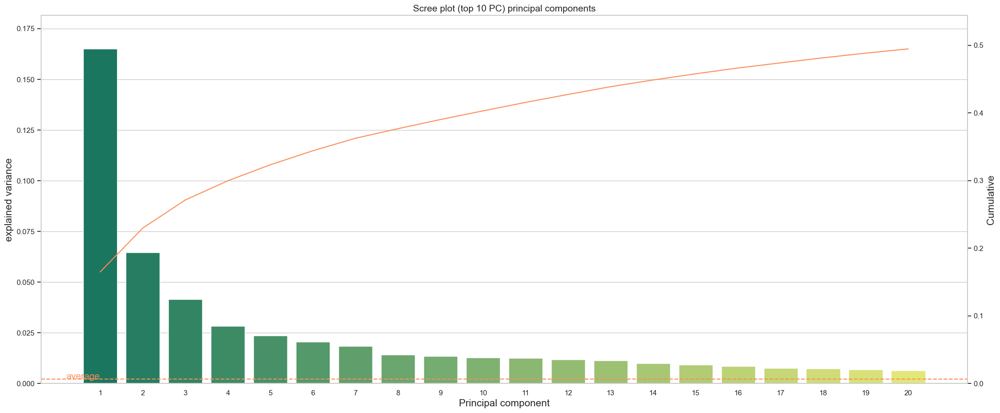

In [2049]:
limit_df = 20

df_explained_variance_limited = df_explained_variance.iloc[:limit_df,:]

fig, ax1 = plt.subplots(figsize=(25,10))

ax1.set_title('Scree plot (top 10 PC) principal components', fontsize=14)
ax1.set_xlabel('Principal component', fontsize=15)
ax1.set_ylabel('Explained variance', fontsize=15)

ax2 = sns.barplot(x=idx[:limit_df], y='explained variance', data=df_explained_variance_limited, palette='summer')
ax2 = ax1.twinx()
ax2.grid(False)
ax2.set_ylabel('Cumulative', fontsize=15)
ax2 = sns.lineplot(x=idx[:limit_df]-1, y='cumulative', data=df_explained_variance_limited, color='#fc8d59')

ax1.axhline(mean_explained_variance, ls='--', color='#fc8d59') #plot mean
ax1.text(-.8, mean_explained_variance+(mean_explained_variance*.05), "average", color='#fc8d59', fontsize=14)

max_y1 = max(df_explained_variance_limited.iloc[:,0])
max_y2 = max(df_explained_variance_limited.iloc[:,1])

ax1.set(ylim=(0, max_y1+max_y1*.1))
ax2.set(ylim=(0, max_y2+max_y2*.1))

plt.show()

The scree plot above represents how much variation each principal component captures from the data for the first 20 componennts. It doesn't look good for us, we can't capture a high threshold of variance from the data using just a few principal components, but it still a relativly big dimentionality reduction so we're going to give it a try. There are a few heuristic for chosing the number of principal components, we can go for the elbow, which is around the 4th-5th component. 

In [2050]:
df_explained_variance.sort_index(ascending=True).head(5)

,explained variance,cumulative
1,0.165017,0.165017
2,0.064768,0.229785
3,0.041479,0.271264
4,0.028397,0.299661
5,0.023673,0.323334


If we go by the elbow we'll retain only 32% of explained variance in the data. We want to aim for 80.

In [2051]:
df_explained_variance[df_explained_variance.cumulative < 0.801].sort_index(ascending=False).head(1)

,explained variance,cumulative
235,0.000477,0.800927


The row above is of the component with which the data reaches 80% explained variance. This means that if we want to keep 80% of variance in the data we'll have to keep 235 PCs. 

In [2052]:
pca_cnn_feat = PCA(n_components=235) 

In [2053]:
train_reduced_deep_feats = pca_cnn_feat.fit_transform(cnn_feat_train_stacked)
test_reduced_deep_feats = pca_cnn_feat.transform(cnn_feat_test_stacked)

## Clustering

### PCA Principal components analysis

In [1347]:
y_binary_train.loc[y_binary_train == 'cancerous'] = 1
y_binary_train.loc[y_binary_train == 'normal'] = 0

y_binary_test.loc[y_binary_test == 'cancerous'] = 1
y_binary_test.loc[y_binary_test == 'normal'] = 0

In [1348]:
y_binary_train = y_binary_train.astype(int)
y_binary_test = y_binary_test.astype(int)

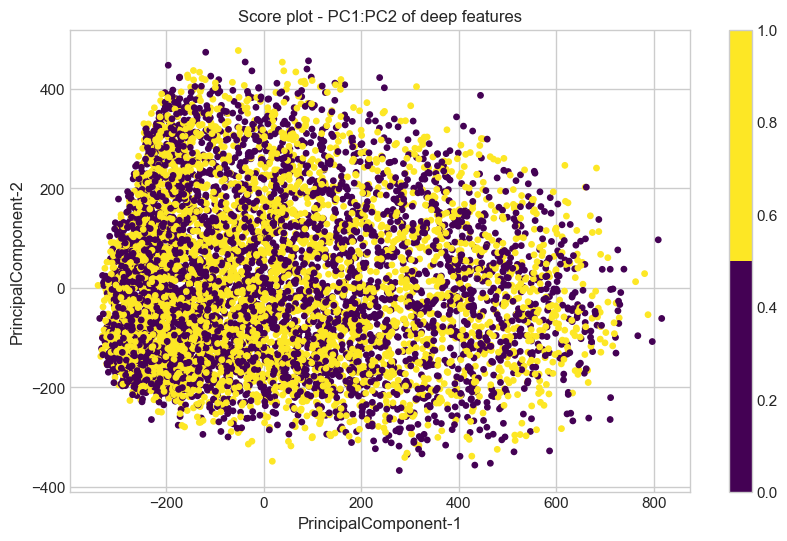

In [2092]:
plt.style.use('seaborn-whitegrid')

plt.figure(figsize = (10,6))

# choose color map
c_map = plt.cm.get_cmap('viridis', 2)

plt.scatter(train_reduced_deep_feats[:, 0], train_reduced_deep_feats[:, 1], s = 15,
            cmap = c_map , c = y_binary_train)

plt.colorbar()

plt.xlabel('PrincipalComponent-1') , plt.ylabel('PrincipalComponent-2')

plt.title('Score plot - PC1:PC2 of deep features')

plt.show()

This score plot doesn't really tell us a lot. We already know that our first two components don't hold a lot of the variance, nothing has formed in the score plot. We can say that most of the edge outliers as wee see them are of normal, non cancerous, data points.

Lets see if we can form something from feeding the images as they are to PCA

In [2098]:
stacked_cropped_images = np.stack(X_train['image'].apply(lambda img: img[30:-30,30:-30]))

In [2101]:
stacked_cropped_images = stacked_cropped_images.flatten(). \
                       reshape(stacked_cropped_images.shape[0],
                              stacked_cropped_images.shape[1]*stacked_cropped_images.shape[2]*stacked_cropped_images.shape[3])

In [2102]:
pca_cropped_images = PCA(n_components=200) 

In [2473]:
scs = StandardScaler()

scaled_stacked_cropped_images = scs.fit_transform(stacked_cropped_images)

In [2474]:
pca_images_train = pca_cropped_images.fit_transform(scaled_stacked_cropped_images)

In [2475]:
n_components = len(pca_cropped_images.explained_variance_ratio_)
explained_variance = pca_cropped_images.explained_variance_ratio_
cum_explained_variance = np.cumsum(explained_variance)
idx = np.arange(n_components)+1
df_explained_variance = pd.DataFrame([explained_variance, cum_explained_variance], 
                                     index=['explained variance', 'cumulative'], 
                                     columns=idx).T
mean_explained_variance = df_explained_variance.iloc[:,0].mean() # calculate mean explained variance# (iii.) Print explained variance as plain text
print('PCA train set extracted deep features overview')
print('='*40)
print("Total: {} components".format(n_components))
print('-'*40)
print('Mean explained variance:', mean_explained_variance)
print('-'*40)
print(df_explained_variance)

PCA train set extracted deep features overview
Total: 200 components
----------------------------------------
Mean explained variance: 0.003982828637782248
----------------------------------------
     explained variance  cumulative
1              0.378140    0.378140
2              0.023900    0.402040
3              0.017467    0.419507
4              0.016635    0.436142
5              0.009205    0.445347
..                  ...         ...
196            0.000592    0.794242
197            0.000590    0.794832
198            0.000585    0.795417
199            0.000578    0.795995
200            0.000571    0.796566

[200 rows x 2 columns]


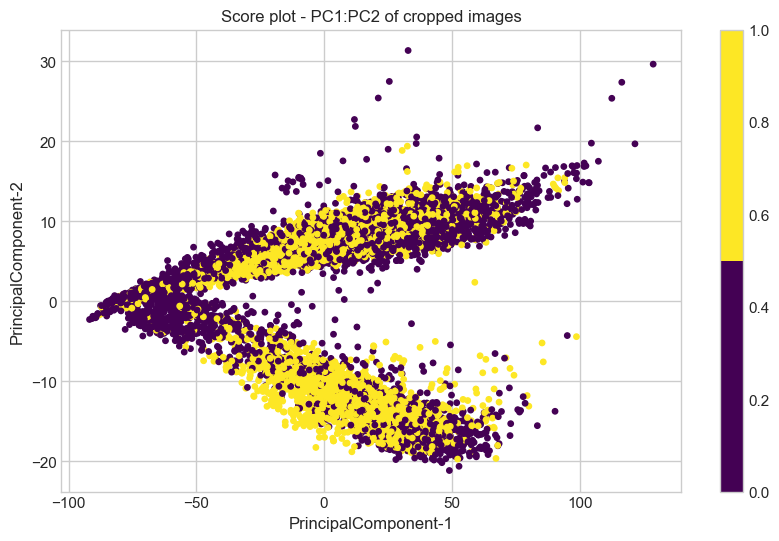

In [2476]:
plt.style.use('seaborn-whitegrid')

plt.figure(figsize = (10,6))

# choose color map
c_map = plt.cm.get_cmap('viridis', 2)

plt.scatter(pca_images_train[:, 0], pca_images_train[:, 1], s = 15,
            cmap = c_map , c = y_binary_train)

plt.colorbar()

plt.xlabel('PrincipalComponent-1') , plt.ylabel('PrincipalComponent-2')

plt.title('Score plot - PC1:PC2 of cropped images')

plt.show()

This score plot deficits the connection between the first two principal components of the cropped center of the image. There's an interesting formation here that we're having a hard time explaining. Cancerous patches are less extreme with their lower values of PC2. Most of the outliers, again, fall into the non cancerous patches.

What's even more interesting, is that because of these PCA results for the raw images, we believe that there's a problem with our feature extraction process. We've tried several things
* cropping the images to the inner rectangle which their classified with
* performing normalization on the images as part of the keras image generator using ZCA whitening and std by fitting the generator
* balancing the dataset
* color normalization

None of these helped improve performance and find interesting patterns in the data.

We tried running other clustering algorithems on the features reduced by PCA. We've decided to choose DBSCAN to help us find if there are maybe more densly connected data points from the original features extracted by VGG19 and the original images. You do not have to configure the number of clusters for PCA, since the algorithem find high denity points and expands the cluster from them. 

In [2464]:
sc = StandardScaler()

scaled_features_dbscan = sc.fit_transform(train_reduced_deep_feats)

In [2484]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps=20, min_samples=100).fit(scaled_features_dbscan)

In [2485]:
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = dbs.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(y_train, labels))
print("Completeness: %0.3f" % metrics.completeness_score(y_train, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(y_train, labels))
print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(y_train, labels))
print(
    "Adjusted Mutual Information: %0.3f"
    % metrics.adjusted_mutual_info_score(y_train, labels)
)

Estimated number of clusters: 1
Estimated number of noise points: 712
Homogeneity: 0.000
Completeness: 0.000
V-measure: 0.000
Adjusted Rand Index: -0.000
Adjusted Mutual Information: -0.000


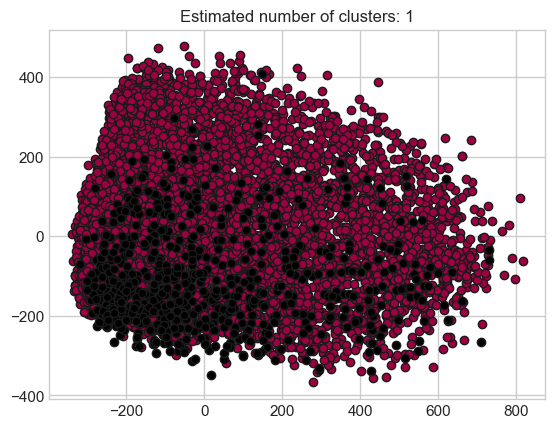

In [2490]:
import matplotlib.pyplot as plt

unique_labels = set(s_labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = train_reduced_deep_feats[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
    )

    xy = train_reduced_deep_feats[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

Above you can see the output of the DBSCAN algorithem on the features of images as reduced by the PCA algorithem. Scaling them using the Standart Scaler was crucial at this point because the original scale of distance is really large. The black points represent noise. Unfortunatly we couldn't produce more than one cluster. The closer data points are on the upper left part of the scatter plot, but looking at the original PCA score plot there is consistency in class within the cluster. This also reflects in the DBCSCAN performance metrics, homogeneity and completness being 0.

### Clustering color features using PCA

In [2080]:
pca_color_feat = PCA() 

In [2081]:
pca_color_channels_train = pca_color_feat.fit_transform(color_channels_features_train)

In [2095]:
n_components = len(pca_color_feat.explained_variance_ratio_)
explained_variance = pca_color_feat.explained_variance_ratio_
cum_explained_variance = np.cumsum(explained_variance)
idx = np.arange(n_components)+1
df_explained_variance = pd.DataFrame([explained_variance, cum_explained_variance], 
                                     index=['explained variance', 'cumulative'], 
                                     columns=idx).T
mean_explained_variance = df_explained_variance.iloc[:,0].mean() # calculate mean explained variance# (iii.) Print explained variance as plain text
print('PCA train set extracted deep features overview')
print('='*40)
print("Total: {} components".format(n_components))
print('-'*40)
print('Mean explained variance:', mean_explained_variance)
print('-'*40)
print(df_explained_variance)

PCA train set extracted deep features overview
Total: 15 components
----------------------------------------
Mean explained variance: 0.06666666666666667
----------------------------------------
    explained variance  cumulative
1         9.593113e-01    0.959311
2         2.544532e-02    0.984757
3         1.094106e-02    0.995698
4         3.514782e-03    0.999213
5         4.941766e-04    0.999707
6         1.694848e-04    0.999876
7         6.322590e-05    0.999939
8         3.951473e-05    0.999979
9         1.267016e-05    0.999992
10        5.598133e-06    0.999997
11        1.735811e-06    0.999999
12        8.987149e-07    1.000000
13        1.513901e-07    1.000000
14        2.390466e-08    1.000000
15        9.051290e-09    1.000000


The first principal component of the extracted colour features is responsible for 95% of variance in the data. We can have 100% of variance by keeping 12 principal components.

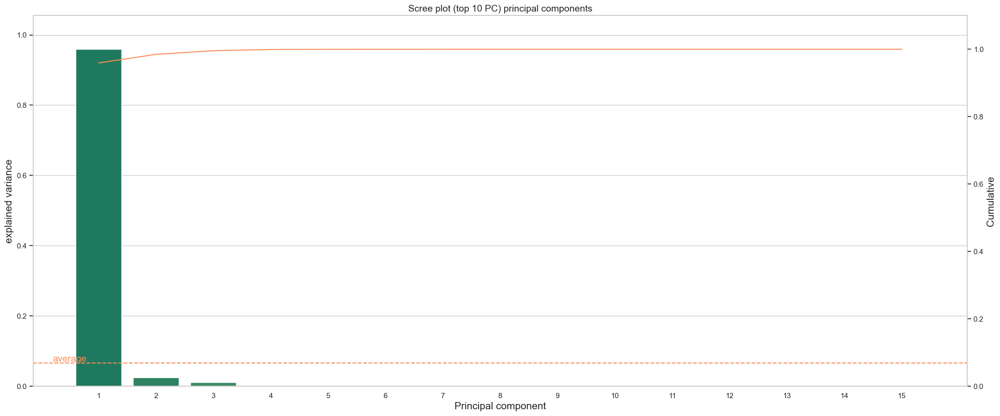

In [2084]:
limit_df = 15

df_explained_variance_limited = df_explained_variance.iloc[:limit_df,:]

fig, ax1 = plt.subplots(figsize=(25,10))

ax1.set_title('Scree plot (top 10 PC) principal components', fontsize=14)
ax1.set_xlabel('Principal component', fontsize=15)
ax1.set_ylabel('Explained variance', fontsize=15)

ax2 = sns.barplot(x=idx[:limit_df], y='explained variance', data=df_explained_variance_limited, palette='summer')
ax2 = ax1.twinx()
ax2.grid(False)
ax2.set_ylabel('Cumulative', fontsize=15)
ax2 = sns.lineplot(x=idx[:limit_df]-1, y='cumulative', data=df_explained_variance_limited, color='#fc8d59')

ax1.axhline(mean_explained_variance, ls='--', color='#fc8d59') #plot mean
ax1.text(-.8, mean_explained_variance+(mean_explained_variance*.05), "average", color='#fc8d59', fontsize=14)

max_y1 = max(df_explained_variance_limited.iloc[:,0])
max_y2 = max(df_explained_variance_limited.iloc[:,1])

ax1.set(ylim=(0, max_y1+max_y1*.1))
ax2.set(ylim=(0, max_y2+max_y2*.1))

plt.show()

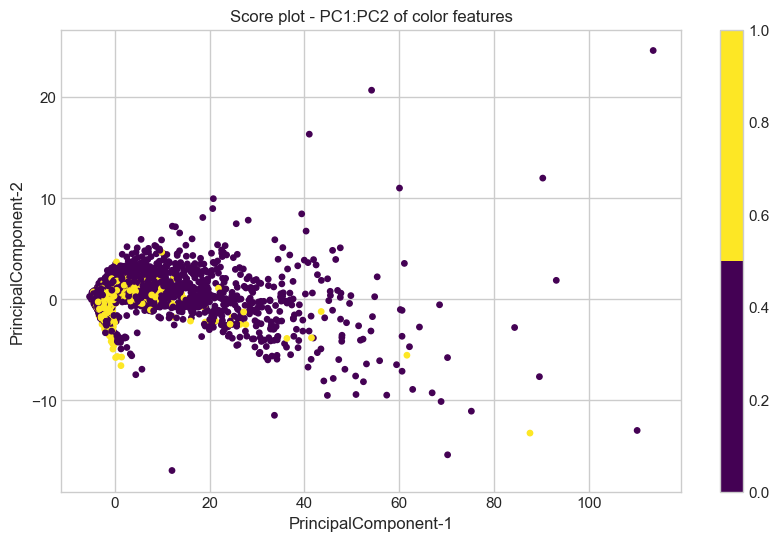

In [2093]:
plt.style.use('seaborn-whitegrid')

plt.figure(figsize = (10,6))

# choose color map
c_map = plt.cm.get_cmap('viridis', 2)

plt.scatter(pca_color_channels_train[:, 0], pca_color_channels_train[:, 1], s = 15,
            cmap = c_map , c = y_binary_train)

plt.colorbar()

plt.xlabel('PrincipalComponent-1') , plt.ylabel('PrincipalComponent-2')

plt.title('Score plot - PC1:PC2 of color features')

plt.show()

Non cancerous samples are again falling into the outliers. You almost see two clusters in this score plot, with cancerous sample are centered around the left down corner of the score plot. 

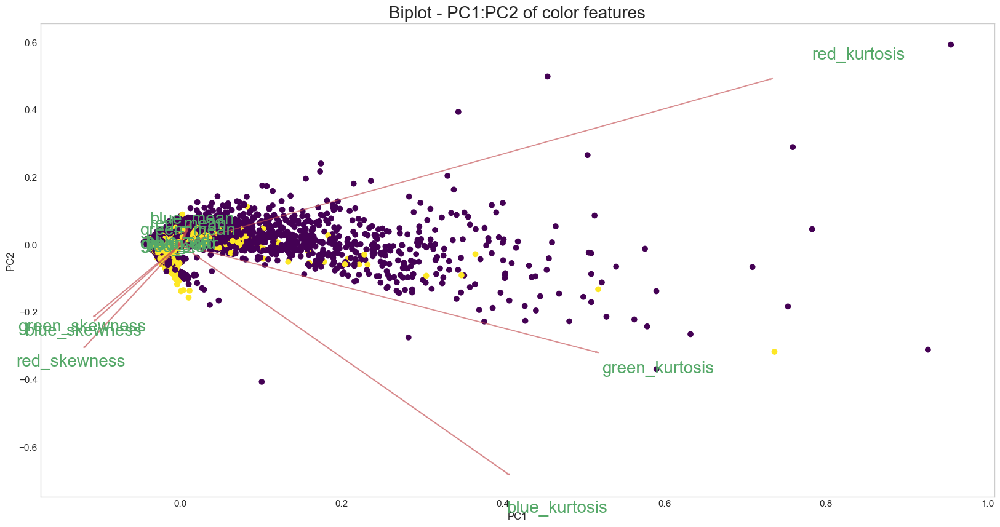

In [2119]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, cmap = c_map, c = y_binary_train)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), fontsize=12, color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], fontsize=20, color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.title("Biplot - PC1:PC2 of color features", fontsize=20)
    plt.grid()

plt.figure(figsize = (20, 10))
myplot(pca_color_channels_train[:,0:2],np.transpose(pca_color_feat.components_[0:2, :]),list(color_channels_features_train.columns))
plt.show()

Above we can see the biplot of the PCA output of the color features. The main point we take for here is that clearly see that red kurtosis have the most weight for both the pc1 and the pc2. It's relativly correlated with green and blue kurtosis metrics.

## Classification

In [ ]:
import shap
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, PrecisionRecallDisplay, average_precision_score, precision_recall_curve

* ## Neural Net

At first we wanted to propose the classification part of the ANN to be similar to the one proposed by Dabeer, Sumaiya and Khan (2019). Dealing with similar data, they were proposing a method to solve the same binary classification problem but for breast cancer. The first 6 layers are the convolutional neural network and are used for feature extraction, the classification is done by the three last layers of the fully connected artificial neural network. We took only their classification model and used it for the feature set extracted from VGG19. But then we realised they had an excesive amount of percepton compared to the dimentions of our data. Although their data was similary compressed to elimiate redundant pixels and reduce computational overhead, they had higher pixel rosolution, 700x460,  After image compression, they could train their model on their given hardware for 500 epochs.

### 1. Neural net with deep features with neural net

In [3193]:
classification_model = models.Sequential()

classification_model.add(layers.InputLayer(input_shape=(train_reduced_deep_feats.shape[1],)))
classification_model.add(layers.Dense(12, activation='relu', name = 'ANNL1'))
classification_model.add(layers.Dense(12, activation='relu', name = 'ANNL2'))
classification_model.add(layers.Dense(12, activation='relu', name = 'ANNL3'))

classification_model.add(layers.Dense(2, activation='softmax', name = 'Decision'))

We are defining two callbacks, one for early stopping to avoid the computational overhead and to get the best possible results and on for reducing the learning rate according to the reduction of the monitored metric.

In [3194]:
earlystop_callback = EarlyStopping(
    monitor="val_loss",
    patience=10,
    restore_best_weights=True
)

reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=1, min_lr=0.001)

In [3195]:
classification_model.compile(optimizer='SGD',
                              loss='sparse_categorical_crossentropy',
                              metrics=['accuracy'])

In [3196]:
classification_model_result = classification_model.fit(x=train_reduced_deep_feats, y=y_binary_train,
                            validation_data=(test_reduced_deep_feats, y_binary_test),
                        callbacks=[earlystop_callback, reduce_lr_callback], epochs=500, verbose=0)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


###  Nerual net with deep features evaluation

In [3197]:
cnn_feats_history_pd = pd.DataFrame(classification_model_result.history)

<AxesSubplot:>

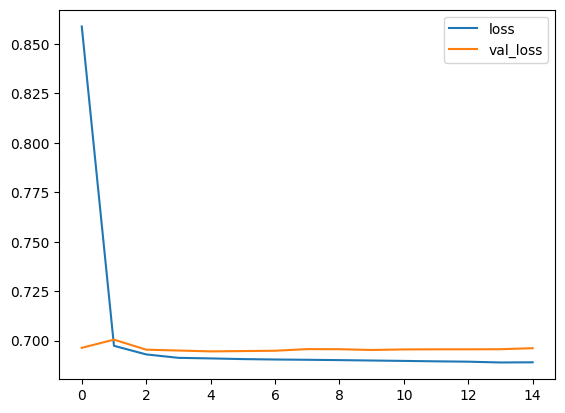

In [3198]:
# larger val loss? Over fitting
cnn_feats_history_pd[['loss','val_loss']].plot()

The above plot represents the loss for the train set versus the loss for the validation set. Our validation loss metric is not decreasing after the third epoch, which explains why the training phase ended after 13 epochs instead of 500.

<AxesSubplot:>

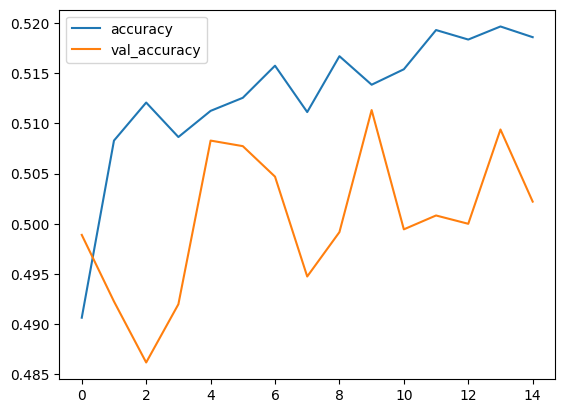

In [3199]:
cnn_feats_history_pd[['accuracy','val_accuracy']].plot()

In the plot above we can see that train accuracy keeps steadily rising while validation accuracy is staying around 0.5 with high drop and ups. This might be explained by the amount of data.

In [3200]:
y_probs = classification_model.predict(test_reduced_deep_feats)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


In [3201]:
y_predicted = np.argmax(y_probs, axis=-1)

In [3205]:
# notice the y_test and not cat
print(classification_report(y_binary_test, y_predicted, digits=4, target_names=['normal','cancerous']))

              precision    recall  f1-score   support

      normal     0.5059    0.7081    0.5902      1809
   cancerous     0.5138    0.3085    0.3855      1809

    accuracy                         0.5083      3618
   macro avg     0.5099    0.5083    0.4878      3618
weighted avg     0.5099    0.5083    0.4878      3618



Our model's accuracy is slightly better than a random chance, with all evaluation metrics being slightly above 0.5. it doesn't do a god job in truely distinguishing between the two classes.

In [3206]:
deep_feats_cm = confusion_matrix(y_binary_test, y_predicted)

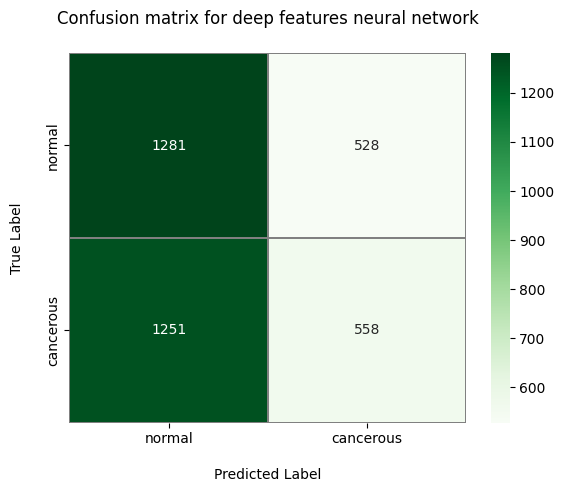

Sensitivity :  0.7081260364842454
Specificity :  0.30845771144278605


In [3207]:
ax = sns.heatmap(deep_feats_cm, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='g')

ax.set_xlabel("\nPredicted Label")
ax.set_ylabel("True Label\n")

ax.xaxis.set_ticklabels(['normal','cancerous'])
ax.yaxis.set_ticklabels(['normal','cancerous'])


ax.set_title("Confusion matrix for deep features neural network\n")

plt.show()

sensitivity1 = deep_feats_cm[0,0]/(deep_feats_cm[0,0]+deep_feats_cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = deep_feats_cm[1,1]/(deep_feats_cm[1,0]+deep_feats_cm[1,1])
print('Specificity : ', specificity1)

From the confusion matrix we can see that our model tends to classify patches as normal patches in general. 528 normal patches were classified as cancerous versus 1251 cancerous patches classified as normal.

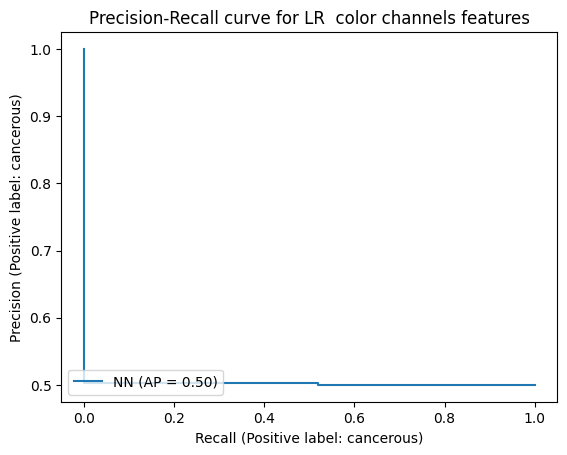

In [3078]:
display = PrecisionRecallDisplay.from_predictions(y_binary_test, y_predicted, name="NN")

display.ax_.set_xlabel("Recall (Positive label: cancerous)")
display.ax_.set_ylabel("Precision (Positive label: cancerous)")
_ = display.ax_.set_title("Precision-Recall curve for LR  color channels features")

Our overall precision stays around 0.5.

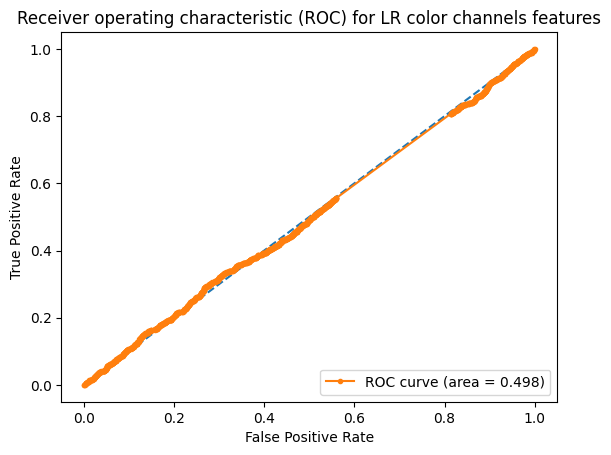

In [3208]:
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_binary_test))]

# predict probabilities
lr_probs = y_probs

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_binary_test, ns_probs)
lr_auc = roc_auc_score(y_binary_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_binary_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_binary_test, lr_probs)

# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--')
plt.plot(lr_fpr, lr_tpr, marker='.', label="ROC curve (area = %0.3f)" % lr_auc)

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver operating characteristic (ROC) for LR color channels features")
plt.legend(loc="lower right")

# show the plot
plt.show()

The chart below shows the ROC curve. Our AUC is 0.502, which means, again, that our model is as good as dropping a coin for distinguishing between the two classes.

### 2. Neural net with deep features and color features

We'll now try fusing our deep features with color features, similar to what was done in Cai at al., paper from 2022, where they fused deep features with other features extracted from the histological images, and see if we get any improvment in performance.

In [3209]:
X_train_feats = pd.concat([pd.DataFrame(train_reduced_deep_feats).reset_index(drop=True), color_channels_features_train.reset_index(drop=True)], axis=1)
X_test_feats = pd.concat([pd.DataFrame(test_reduced_deep_feats).reset_index(drop=True), color_channels_features_test.reset_index(drop=True)], axis=1)

In [3211]:
classification_model_with_color = models.Sequential()

classification_model_with_color.add(layers.InputLayer(input_shape=(250,)))
classification_model_with_color.add(layers.Dense(12, activation='relu', name = 'ANNL1'))
classification_model_with_color.add(layers.Dense(12, activation='relu', name = 'ANNL2'))
classification_model_with_color.add(layers.Dense(12, activation='relu', name = 'ANNL3'))

classification_model_with_color.add(layers.Dense(2, activation='softmax', name = 'Decision'))

We are defining two callbacks, one for early stopping to avoid the computational overhead and to get the best possible results and on for reducing the learning rate according to the reduction of the monitored metric.

In [3212]:
earlystop_callback = EarlyStopping(
    monitor="val_loss",
    patience=10,
    restore_best_weights=True
)

reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=1, min_lr=0.001)

In [3213]:
classification_model_with_color.compile(optimizer=SGD(learning_rate=0.01),
                              loss='sparse_categorical_crossentropy',
                              metrics=['accuracy'])

In [3214]:
classification_model_result = classification_model_with_color.fit(x=X_train_feats, y=y_binary_train,
                            validation_data=(X_test_feats, y_binary_test),
                        callbacks=[earlystop_callback, reduce_lr_callback], epochs=500, verbose=0)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


###  Nerual net with deep features and color features evaluation

In [3215]:
cnn_feats_history_pd = pd.DataFrame(classification_model_result.history)

<AxesSubplot:>

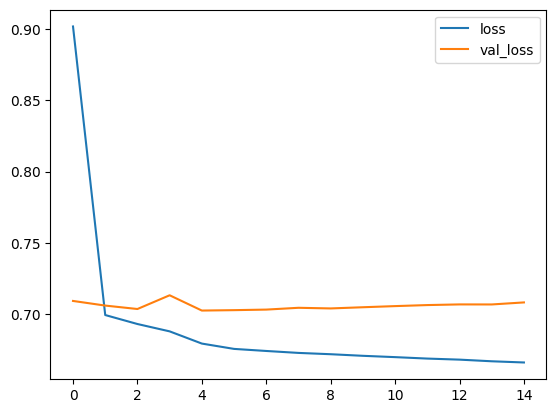

In [3216]:
# larger val loss? Over fitting
cnn_feats_history_pd[['loss','val_loss']].plot()

The above plot represents the loss for the train set versus the loss for the validation set. Our validation loss metric is not decreasing after the third epoch, which explains why the training phase ended after 14 epochs instead of 500.

In [3217]:
y_probs = classification_model_with_color.predict(X_test_feats)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


In [3218]:
y_predicted = np.argmax(y_probs, axis=-1)

In [3219]:
# notice the y_test and not cat
print(classification_report(y_binary_test, y_predicted, digits=4, target_names=['normal','cancerous']))

              precision    recall  f1-score   support

      normal     0.5136    0.5738    0.5420      1809
   cancerous     0.5172    0.4566    0.4850      1809

    accuracy                         0.5152      3618
   macro avg     0.5154    0.5152    0.5135      3618
weighted avg     0.5154    0.5152    0.5135      3618



In the classification report above we're getting around the same number. 

In [3222]:
deep_feats_cm = confusion_matrix(y_binary_test, y_predicted)

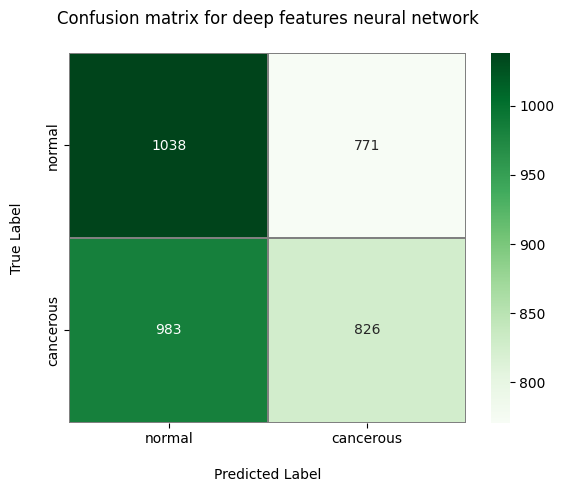

Sensitivity :  0.5737976782752903
Specificity :  0.4566058595909342


In [3223]:
ax = sns.heatmap(deep_feats_cm, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='g')

ax.set_xlabel("\nPredicted Label")
ax.set_ylabel("True Label\n")

ax.xaxis.set_ticklabels(['normal','cancerous'])
ax.yaxis.set_ticklabels(['normal','cancerous'])


ax.set_title("Confusion matrix for deep features neural network\n")

plt.show()

sensitivity1 = deep_feats_cm[0,0]/(deep_feats_cm[0,0]+deep_feats_cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = deep_feats_cm[1,1]/(deep_feats_cm[1,0]+deep_feats_cm[1,1])
print('Specificity : ', specificity1)

Interestingly enough, the same model fused with the color features is a little bit better in classified cancerous images. 983 cancerous images were classified as normal ones compared to 1251 for the same model without the color features. 

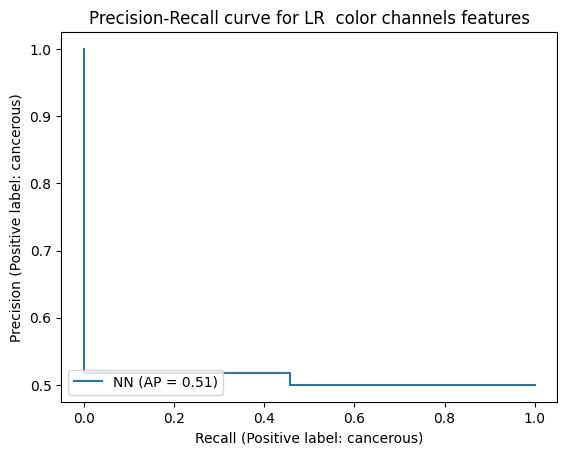

In [3224]:
display = PrecisionRecallDisplay.from_predictions(y_binary_test, y_predicted, name="NN")

display.ax_.set_xlabel("Recall (Positive label: cancerous)")
display.ax_.set_ylabel("Precision (Positive label: cancerous)")
_ = display.ax_.set_title("Precision-Recall curve for LR  color channels features")

There is a tradeoff bween precision and recall inn the middle, but it's not severe, and in general precision stays ar around 0.51-0.5.

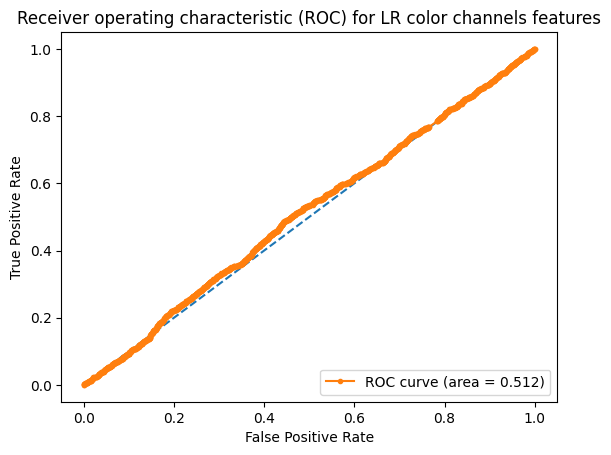

In [3225]:
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_binary_test))]

# predict probabilities
lr_probs = y_probs

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_binary_test, ns_probs)
lr_auc = roc_auc_score(y_binary_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_binary_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_binary_test, lr_probs)

# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--')
plt.plot(lr_fpr, lr_tpr, marker='.', label="ROC curve (area = %0.3f)" % lr_auc)

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver operating characteristic (ROC) for LR color channels features")
plt.legend(loc="lower right")

# show the plot
plt.show()

The chart below shows the ROC curve. Our model is performing pretty bad.

* ### Logistic Regression (LR) 

In [399]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

In [400]:
y_binary_train = y_train.copy()
y_binary_test = y_test.copy()

In [401]:
y_binary_train.loc[y_binary_train == 'cancerous'] = 1
y_binary_train.loc[y_binary_train == 'normal'] = 0

y_binary_test.loc[y_binary_test == 'cancerous'] = 1
y_binary_test.loc[y_binary_test == 'normal'] = 0

In [402]:
y_binary_train = y_binary_train.astype(int)
y_binary_test = y_binary_test.astype(int)

   ### 1. Color features

In [416]:
lr_colors = LogisticRegression(max_iter=150, random_state=0)

In [417]:
scaler = StandardScaler().fit(color_channels_features_train)

In [418]:
color_features_train_scaled = scaler.transform(color_channels_features_train)
color_features_test_scaled = scaler.transform(color_channels_features_test)

In [419]:
lr_colors.fit(color_features_train_scaled, y_binary_train)

LogisticRegression(max_iter=150, random_state=0)

In [420]:
y_pred = lr_colors.predict(color_features_test_scaled)

### Color features logistic regression model evaluation

In [443]:
import shap
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, PrecisionRecallDisplay, average_precision_score, precision_recall_curve

In [432]:
print(classification_report(y_binary_test, y_pred, digits=4, target_names=['normal','cancerous']))
print(f"Accuracy score: {accuracy_score(y_binary_test, y_pred)}")

              precision    recall  f1-score   support

      normal     0.8306    0.8351    0.8328      2589
   cancerous     0.7621    0.7562    0.7592      1809

    accuracy                         0.8026      4398
   macro avg     0.7963    0.7956    0.7960      4398
weighted avg     0.8024    0.8026    0.8025      4398

Accuracy score: 0.802637562528422


The above report is the classification report for the LR model using color channel features only. 
* This model reached an accuracy score of 0.8026.
* 0.802 of prediction made were correct
* 0.803 of images were indeed indentified and classified to their own class (recall)
* 0.802 the harmonic mean, combination, of recall and  percision (f1-score)

If we look at the metrics for each  class separatly, our model was better at predicting and identifying non cancerous images than cancerous images.

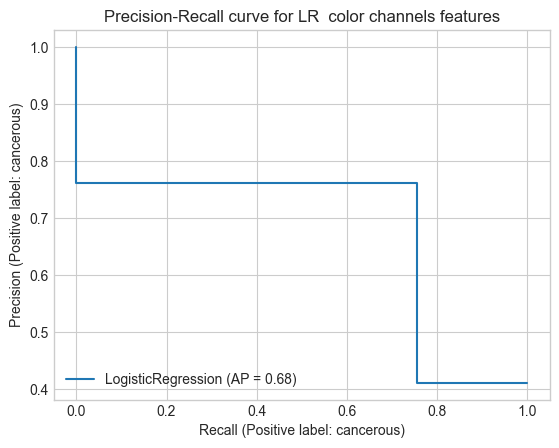

In [450]:
display = PrecisionRecallDisplay.from_predictions(y_binary_test, y_pred, name="LogisticRegression")

display.ax_.set_xlabel("Recall (Positive label: cancerous)")
display.ax_.set_ylabel("Precision (Positive label: cancerous)")
_ = display.ax_.set_title("Precision-Recall curve for LR  color channels features")

In the plot line above we can see precision to recall curve for our model. The average percision is 0.68. High precision relates to a low false positive rate, and high recall relates to a low false negative rate. We can see that our graph has a different tradeoff at every threshold, with moderate percision rates and moderate recall rates.

In [423]:
color_feats_cm = confusion_matrix(y_binary_test, y_pred)

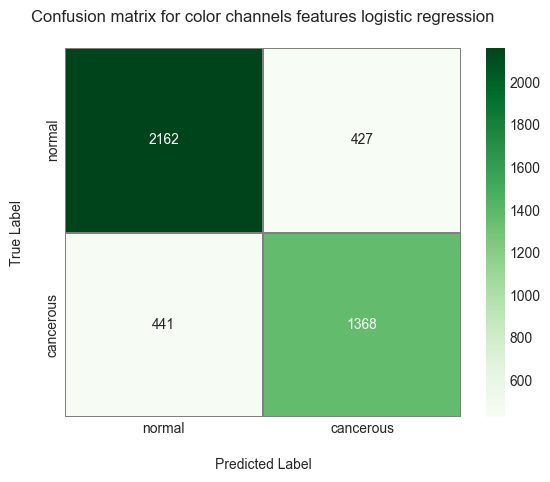

Sensitivity :  0.8350714561606798
Specificity :  0.7562189054726368


In [438]:
ax = sns.heatmap(color_feats_cm, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='g')

ax.set_xlabel("\nPredicted Label")
ax.set_ylabel("True Label\n")

ax.xaxis.set_ticklabels(['normal','cancerous'])
ax.yaxis.set_ticklabels(['normal','cancerous'])


ax.set_title("Confusion matrix for color channels features logistic regression\n")

plt.show()

sensitivity1 = color_feats_cm[0,0]/(color_feats_cm[0,0]+color_feats_cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = color_feats_cm[1,1]/(color_feats_cm[1,0]+color_feats_cm[1,1])
print('Specificity : ', specificity1)

The heatmap above represents the confusion matrix for the LR model using the colour features. We can see that most of the data was classified correctly, almost the same number of predictions were made incorrect for each class. 441 cancerous patches were confused with normal and 427 normal patches were confused with cancerous. Overall most patches were classified correctly using only the extracted color features for each channel. The sensitivity score achieved is 0.8351 and the specificity score achieved is 0.7562. In other words, this model is able to identify cancerous patches 83.5% of cases and correctly identify non cancerous patches in 75.62% of cases.

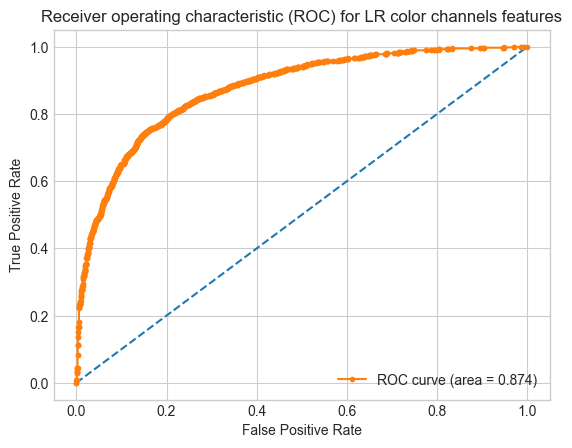

In [425]:
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]

# predict probabilities
lr_probs = lr_colors.predict_proba(color_features_test_scaled)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_binary_test, ns_probs)
lr_auc = roc_auc_score(y_binary_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_binary_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_binary_test, lr_probs)

# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--')
plt.plot(lr_fpr, lr_tpr, marker='.', label="ROC curve (area = %0.3f)" % lr_auc)

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver operating characteristic (ROC) for LR color channels features")
plt.legend(loc="lower right")

# show the plot
plt.show()

The area under the curve (AUC) is 0.874. We believe that 0.874 AUC, is not perfect but a highe value is as a measure of separability between cancerous and normal tissue. The probability that this model will distiguishing between normal and cancerous tissue is 87.4%.

In [427]:
explainer = shap.Explainer(lr_colors, color_features_train_scaled, feature_names=color_channels_features_train.columns)
shap_values = explainer(color_features_test_scaled)

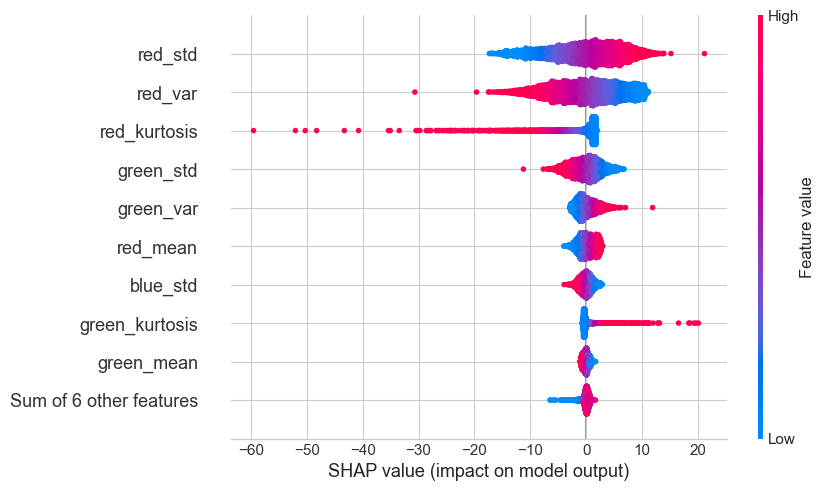

In [428]:
shap.plots.beeswarm(shap_values)

The beeswarm visualisation above we can see how the top color channel features impact the LR model output. Interestingly,the three top features were all extracted from the red channel. 
* High values of the red channels standart deviation have a positive contribution on the prediction
* Low values of the red channel standart deviation have a positive contribution on the prediction
* Red variance and kurtosis are the exact opposite to the influence of red standart deviation, low values of these metrics have a positive contribution on the prediction

The fact that all influential features were all extracted from the red channel really corresponds with the PCA biplot we saw earlier on. 

If we look back at the different channels distributions and differences in brightness this makes a lot of sense. Kurtosis is a measure of the tailedness of a distribution, standart deviation is the distance of values from the mean and variance is the power of that values. All  these measures essentially express variability in a distribution. In the color distribution charts we've seen higher variance for the red channel over the green and the blue, with higher frequencies of color intensities and the highest brightness peak. 
We've also seen a difference between these stats inbetween the classes, with the normal, non cancerous images, seemingly more saturated, higher values more frequent, than cancerous images. We now see that these metrics of color channels pixel distribution did in fact contribute to image classification.

### 2. HOG features logistic regression model evaluation

In [3261]:
hog_features_train_stack = np.stack(hog_features_train)
hog_features_test_stack = np.stack(hog_features_test)

In [3262]:
lr_hog = LogisticRegression(max_iter=1000, random_state=0)

In [3263]:
hog_scaler = StandardScaler().fit(hog_features_train_stack)

In [3264]:
hog_features_train_scaled = hog_scaler.transform(hog_features_train_stack)
hog_features_test_scaled = hog_scaler.transform(hog_features_test_stack)

In [3265]:
lr_hog.fit(hog_features_train_scaled, y_binary_train)

LogisticRegression(max_iter=1000, random_state=0)

In [3266]:
y_hog_pred = lr_hog.predict(hog_features_test_scaled)

### HOG features logistic regression model evaluation

In [3267]:
print(classification_report(y_binary_test, y_hog_pred, digits=4, target_names=['normal','cancerous']))
print(f"Accuracy score: {accuracy_score(y_binary_test, y_hog_pred)}")

              precision    recall  f1-score   support

      normal     0.5679    0.5799    0.5739      1809
   cancerous     0.5709    0.5589    0.5648      1809

    accuracy                         0.5694      3618
   macro avg     0.5694    0.5694    0.5693      3618
weighted avg     0.5694    0.5694    0.5693      3618

Accuracy score: 0.5693753454947484


The above report is the classification report for the LR model using HOG features only. 
* This model reached an accuracy score of 0.7214
* 0.7214 of prediction made were correct
* 0.7214 of images were indeed indentified and classified to their own class (recall)
* 0.7213 the harmonic mean, combination, of recall and  percision (f1-score)

If we look at the metrics for each  class separatly, our model was better at predicting and identifying non cancerous images than cancerous images.

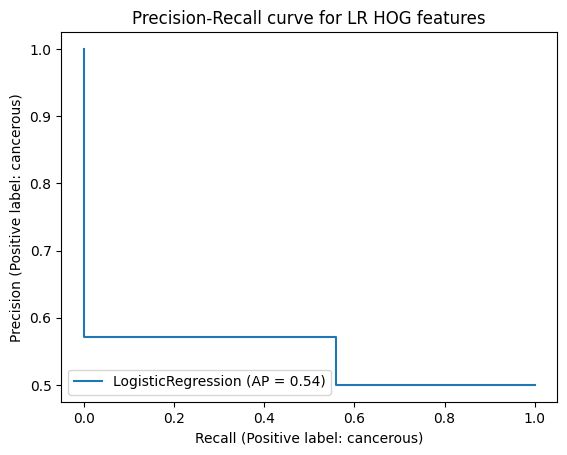

In [3268]:
display = PrecisionRecallDisplay.from_predictions(y_binary_test, y_hog_pred, name="LogisticRegression")

display.ax_.set_xlabel("Recall (Positive label: cancerous)")
display.ax_.set_ylabel("Precision (Positive label: cancerous)")
_ = display.ax_.set_title("Precision-Recall curve for LR HOG features")

In the plot line above we can see precision to recall curve for our model. The average percision is 0.66. High precision relates to a low false positive rate, and high recall relates to a low false negative rate. We can see that our graph has a single tradeoff threshold, with a mmoderase persision rate at 

In [3269]:
hog_feats_cm = confusion_matrix(y_binary_test, y_hog_pred)

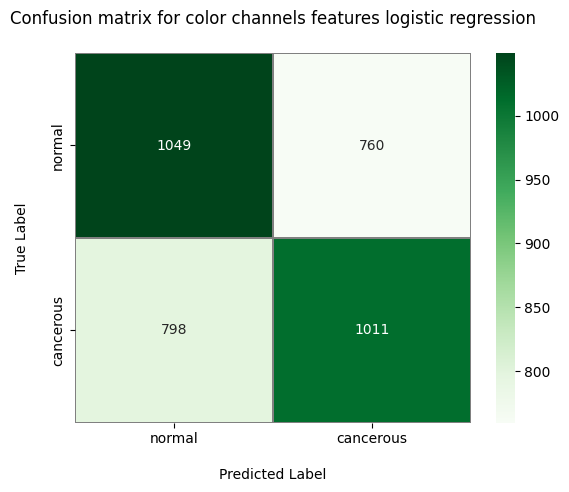

Sensitivity :  0.5798783858485351
Specificity :  0.5588723051409619


In [3270]:
ax = sns.heatmap(hog_feats_cm, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='g')

ax.set_xlabel("\nPredicted Label")
ax.set_ylabel("True Label\n")

ax.xaxis.set_ticklabels(['normal','cancerous'])
ax.yaxis.set_ticklabels(['normal','cancerous'])


ax.set_title("Confusion matrix for color channels features logistic regression\n")

plt.show()

sensitivity1 = hog_feats_cm[0,0]/(hog_feats_cm[0,0]+hog_feats_cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = hog_feats_cm[1,1]/(hog_feats_cm[1,0]+hog_feats_cm[1,1])
print('Specificity : ', specificity1)

The heatmap above represents the confusion matrix for the LR model using the HOG features. We can see that most of the data was classified correctly, almost the same number of predictions were made incorrect for each class. 465 cancerous patches were confused with normal and 543 normal patches were confused with cancerous. Overall most patches were classified correctly using only the extracted HOG features. The sensitivity score achieved is 0.6998 and the specificity score achieved is 0.7543. 

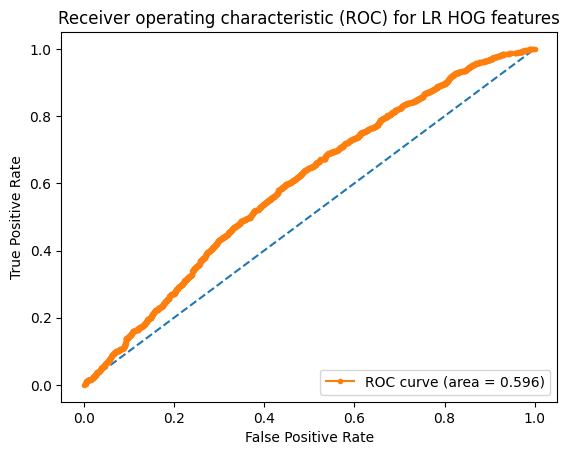

In [3271]:
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]

# predict probabilities
lr_probs = lr_hog.predict_proba(hog_features_test_scaled)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_binary_test, ns_probs)
lr_auc = roc_auc_score(y_binary_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_binary_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_binary_test, lr_probs)

# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--')
plt.plot(lr_fpr, lr_tpr, marker='.', label="ROC curve (area = %0.3f)" % lr_auc)

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver operating characteristic (ROC) for LR HOG features")
plt.legend(loc="lower right")

# show the plot
plt.show()

The area under the curve (AUC) is 0.783. The probability that this model will distiguishing between normal and cancerous tissue is 78.3%.

### 3. LBP Logistic regression model evaluation

In [3335]:
lbp_features_train_stack = np.stack(lbp_features_train)
lbp_features_test_stack = np.stack(lbp_features_test)

In [3336]:
lr_lbp = LogisticRegression(max_iter=1000, random_state=0)

In [3337]:
lbp_scaler = StandardScaler().fit(lbp_features_train_stack)

In [3338]:
lbp_features_train_scaled = lbp_scaler.transform(lbp_features_train_stack)
lbp_features_test_scaled = lbp_scaler.transform(lbp_features_test_stack)

In [3339]:
lr_lbp.fit(lbp_features_train_scaled, y_binary_train)

LogisticRegression(max_iter=1000, random_state=0)

In [3340]:
y_lbp_pred = lr_lbp.predict(lbp_features_test_scaled)

### LBP features logistic regression model evaluation

In [3341]:
print(classification_report(y_binary_test, y_lbp_pred, digits=4, target_names=['normal','cancerous']))
print(f"Accuracy score: {accuracy_score(y_binary_test, y_lbp_pred)}")

              precision    recall  f1-score   support

      normal     0.7525    0.7192    0.7354      1809
   cancerous     0.7311    0.7634    0.7469      1809

    accuracy                         0.7413      3618
   macro avg     0.7418    0.7413    0.7412      3618
weighted avg     0.7418    0.7413    0.7412      3618

Accuracy score: 0.7412935323383084


The above report is the classification report for the LR model using LBP features only. 
* This model reached an accuracy score of 0.7214
* 0.7214 of prediction made were correct
* 0.7214 of images were indeed indentified and classified to their own class (recall)
* 0.7213 the harmonic mean, combination, of recall and  percision (f1-score)

If we look at the metrics for each  class separatly, our model was better at predicting and identifying non cancerous images than cancerous images.

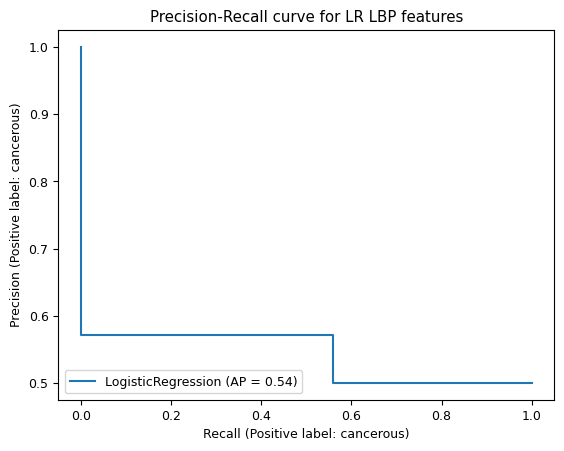

In [3342]:
display = PrecisionRecallDisplay.from_predictions(y_binary_test, y_hog_pred, name="LogisticRegression")

display.ax_.set_xlabel("Recall (Positive label: cancerous)")
display.ax_.set_ylabel("Precision (Positive label: cancerous)")
_ = display.ax_.set_title("Precision-Recall curve for LR LBP features")

In the plot line above we can see precision to recall curve for our model. The average percision is 0.66. High precision relates to a low false positive rate, and high recall relates to a low false negative rate. We can see that our graph has a single tradeoff threshold, with a mmoderase persision rate at 

In [3343]:
lbp_feats_cm = confusion_matrix(y_binary_test, y_lbp_pred)

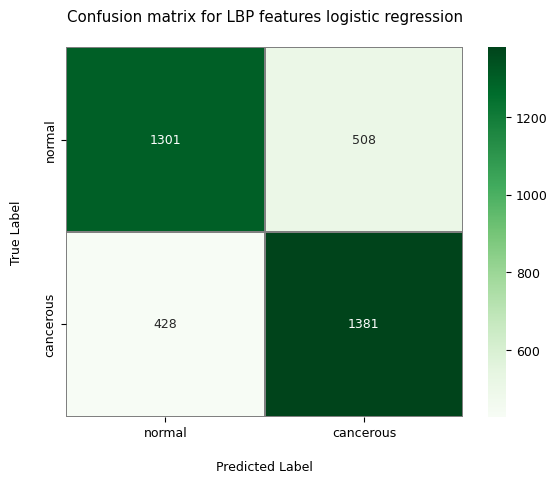

Sensitivity :  0.7191818684355997
Specificity :  0.7634051962410171


In [3344]:
ax = sns.heatmap(lbp_feats_cm, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='g')

ax.set_xlabel("\nPredicted Label")
ax.set_ylabel("True Label\n")

ax.xaxis.set_ticklabels(['normal','cancerous'])
ax.yaxis.set_ticklabels(['normal','cancerous'])


ax.set_title("Confusion matrix for LBP features logistic regression\n")

plt.show()

sensitivity1 = lbp_feats_cm[0,0]/(lbp_feats_cm[0,0]+lbp_feats_cm[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = lbp_feats_cm[1,1]/(lbp_feats_cm[1,0]+lbp_feats_cm[1,1])
print('Specificity : ', specificity1)

The heatmap above represents the confusion matrix for the LR model using the LBP features. We can see that most of the data was classified correctly, almost the same number of predictions were made incorrect for each class. 465 cancerous patches were confused with normal and 543 normal patches were confused with cancerous. Overall most patches were classified correctly using only the extracted lbp features. The sensitivity score achieved is 0.6998 and the specificity score achieved is 0.7543. 

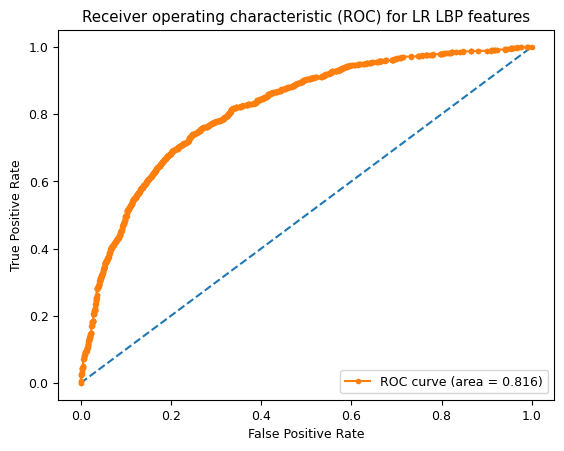

In [3345]:
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]

# predict probabilities
lr_probs = lr_lbp.predict_proba(lbp_features_test_scaled)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_binary_test, ns_probs)
lr_auc = roc_auc_score(y_binary_test, lr_probs)

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_binary_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_binary_test, lr_probs)

# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--')
plt.plot(lr_fpr, lr_tpr, marker='.', label="ROC curve (area = %0.3f)" % lr_auc)

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver operating characteristic (ROC) for LR LBP features")
plt.legend(loc="lower right")

# show the plot
plt.show()

The area under the curve (AUC) is 0.783. The probability that this model will distiguishing between normal and cancerous tissue is 78.3%.

## Summary

In this project we tried to predict the class of a given histological patch as being normal or cancerous. We've extracted and worked with 4 extracted sets of features:
1. Deep features extracted from VGG19
1. Channel color statistical features
1. HOG
1. LBP

We've proposed two model types:
1. NN
1. LR

| Model 	| Feature set                              	| Hyper parameters                                                                	| Precision 	| Recall 	| f1-score 	| Accuracy 	| ROC Area  	| Specificity 	| Sensitivity 	|
|-------	|------------------------------------------	|---------------------------------------------------------------------------------	|-----------	|--------	|----------	|----------	|-----------	|-------------	|-------------	|
| NN    	| Deep features                            	| Adam optimizer                                                                  	| 0.4874    	| 0.4876 	| 0.4864   	| 0.4876   	| 0.492     	| 0.4394      	| 0.5356      	|
| NN    	| Deep features                            	| RMSprop optimizer                                                               	| 0.5033    	| 0.5033 	| 0.5032   	| 0.5033   	| 0.502     	| 0.5201      	| 0.4864      	|
| NN    	| Deep features                            	| SGD optimizer                                                                   	| 0.5141    	| 0.5116 	| 0.4889   	| 0.5116   	| 0.505     	| 0.3007      	| 0.7224      	|
| NN    	| Deep features +   channel color features 	| SGD optimizer                                                                   	| 0.5154    	| 0.5152 	| 0.5135   	| 0.5152   	| 0.512     	| 0.4566      	| 0.5737      	|
| LR    	| Channel color features                   	| LR: max_iter=150 StandartScaler                                                 	| 0.8024    	| 0.8026 	| 0.8025   	| 0.8026   	| **0.874** 	| 0.8350      	| 0.7562      	|
| LR    	| HOG                                      	| Image resize: 64,128 Pixels: 6 Cells: 3 Orientation: 12 MinMaxScaler            	| 0.5758    	| 0.5771 	| 0.5764   	| 0.577    	| 0.605     	| 0.4759      	| 0.6477      	|
| LR    	| HOG                                      	| No image resize Pixels: 6 Cells: 3 Orientation: 12 No scaler                    	| 0.5950    	| 0.5960 	| 0.5954   	| 0.5959   	| **0.639** 	| 0.5008      	| 0.6624      	|
| LR    	| HOG                                      	| No image resize Image crop (36x36) Pixels: 6 Cells: 3 Orientation: 12 No scaler 	| 0.5662    	| 0.5809 	| 0.5665   	| 0.5809   	| 0.606     	| 0.3571      	| 0.7373      	|
| LR    	| LBP                                      	| radius 2 n_points 8 StandardScaler                                              	| 0.7218    	| 0.7214 	| 0.7213   	| 0.7214   	| 0.783     	| 0.7429      	| 0.6998      	|
| LR    	| LBP                                      	| radius 2 n_points 6                                                             	| 0.7261    	| 0.7250 	| 0.7246   	| 0.7249   	| 0.777     	| 0.7600      	| 0.6898      	|
| LR    	| LBP                                      	| radius 1 n_points 8                                                             	| 0.7418    	| 0.7413 	| 0.7412   	| 0.7413   	| **0.816** 	| 0.7634      	| 0.7191      	|

## References
1. Alhindi, Taha J.; Kalra, Shivam; Ng, Ka Hin; Afrin, Anika; Tizhoosh, Hamid R. (2018). [IEEE 2018 International Joint Conference on Neural Networks (IJCNN) - Rio de Janeiro (2018.7.8-2018.7.13)] 2018 International Joint Conference on Neural Networks (IJCNN) - Comparing LBP, HOG and Deep Features for Classification of Histopathology Images. , (), 1–7. doi:10.1109/IJCNN.2018.8489329  
1. American Joint Committee on Cancer. AJCC Cancer Staging Manual, 8th ed. New York: Springer 2017: 715-725.
1. Behar, N., Shrivastava, M. (2022). ResNet50-Based Effective Model for Breast Cancer Classification Using Histopathology Images. CMES-Computer Modeling in Engineering & Sciences, 130(2), 823–839. 
1. Bhattacharjee, S., Kim, C. H., Park, H. G., Prakash, D., Madusanka, N., Cho, N. H., & Choi, H. K. (2019). Multi-Features Classification of Prostate Carcinoma Observed in Histological Sections: Analysis of Wavelet-Based Texture and Colour Features. Cancers, 11(12), 1937. https://doi.org/10.3390/cancers11121937
1. Cai J, Liu M, Zhang Q, Shao Z, Zhou J, Guo Y, Liu J, Wang X, Zhang B, Li X. Renal Cancer Detection: Fusing Deep and Texture Features from Histopathology Images. Biomed Res Int. 2022 Mar 28;2022:9821773. doi: 10.1155/2022/9821773. PMID: 35386304; PMCID: PMC8979690.
1. Dabeer, Sumaiya & Khan, Maha Mohammed & Islam, Saiful. (2019). Cancer diagnosis in histopathological image: CNN based approach. Informatics in Medicine Unlocked. 16. 100231. 10.1016/j.imu.2019.100231. 
1. Fox H. (2000). Is H&E morphology coming to an end?. Journal of clinical pathology, 53(1), 38–40. https://doi.org/10.1136/jcp.53.1.38
1. Galton, A., Fouad, S., Landini, G., & Randell, D. (2017). Errors and artefacts in histopathological imaging. CEUR Workshop Proceedings, 2137.
1. J.D. Bancroft, M. Gamble, Theory and practice of histological techniques, Elsevier health sciences, 2008
1. Sara Hosseinzadeh Kassani, Peyman Hosseinzadeh Kassani, Michal J. Wesolowski, Kevin A. Schneider, and Ralph Deters. 2019. Classification of histopathological biopsy images using ensemble of deep learning networks. In Proceedings of the 29th Annual International Conference on Computer Science and Software Engineering (CASCON '19). IBM Corp., USA, 92–99.
1. Krithiga, R., Geetha, P. Breast Cancer Detection, Segmentation and Classification on Histopathology Images Analysis: A Systematic Review. Arch Computat Methods Eng 28, 2607–2619 (2021). https://doi.org/10.1007/s11831-020-09470-w
1. Ma, J., & Yuan, Y. (2019). Dimension reduction of image deep feature using PCA. J. Vis. Commun. Image Represent., 63.
1. Q. A. Al-Haija and A. Adebanjo, "Breast Cancer Diagnosis in Histopathological Images Using ResNet-50 Convolutional Neural Network," 2020 IEEE International IOT, Electronics and Mechatronics Conference (IEMTRONICS), 2020, pp. 1-7, doi: 10.1109/IEMTRONICS51293.2020.9216455.
1. Salvi, Massimo; Acharya, U.Rajendra; Molinari, Filippo; Meiburger, Kristen.M. (2020). The impact of pre- and post-image processing techniques on deep learning frameworks: a comprehensive review for digital pathology image analysis. Computers in Biology and Medicine, (), 104129–. doi:10.1016/j.compbiomed.2020.104129  
1. Wang, Xiaoyu & Han, Tony & Yan, Shuicheng. (2009). An HOG-LBP human detector with partial occlusion handling. ICCV. 32 - 39. 10.1109/ICCV.2009.5459207. 
1. Zheng, Y., Jiang, Z., Zhang, H., Xie, F., Shi, J., & Xue, C. (2019). Adaptive color deconvolution for histological WSI normalization. Computer methods and programs in biomedicine, 170, 107-120 .

